Look at most recent data - try https://confluence.lsstcorp.org/display/LSSTCOM/2021-10-06+Aux-Tel+Night+Log  , do the "blind wcs test", i.e. fit WCS, and compare to the original one. 

Also, consider https://confluence.lsstcorp.org/display/LSSTCOM/2021-09-08+Aux-Tel+Night+Log  483..390

In [1]:
from lsst.daf import butler as dafButler
butler = dafButler.Butler('/repo/main/')

monthDay = '0908' # '1006'

registry = butler.registry
datasetRefs = list(registry.queryDatasets(instrument='LATISS', datasetType='raw', collections=['LATISS/raw/all'],
                                          where=f"exposure.day_obs=2021{monthDay}"
                                         ))
datasetRefs[0]

DatasetRef(DatasetType('raw', {band, instrument, detector, physical_filter, exposure}, Exposure), {instrument: 'LATISS', detector: 0, exposure: 2021090800001, ...}, id=e8fd4b96-d8d1-53c2-98f6-96ff5fbac729, run='LATISS/raw/all')

In [2]:
datasetRefs

[DatasetRef(DatasetType('raw', {band, instrument, detector, physical_filter, exposure}, Exposure), {instrument: 'LATISS', detector: 0, exposure: 2021090800001, ...}, id=e8fd4b96-d8d1-53c2-98f6-96ff5fbac729, run='LATISS/raw/all'),
 DatasetRef(DatasetType('raw', {band, instrument, detector, physical_filter, exposure}, Exposure), {instrument: 'LATISS', detector: 0, exposure: 2021090800002, ...}, id=59d34fac-1d9e-5659-9366-02c63e661d32, run='LATISS/raw/all'),
 DatasetRef(DatasetType('raw', {band, instrument, detector, physical_filter, exposure}, Exposure), {instrument: 'LATISS', detector: 0, exposure: 2021090800003, ...}, id=76da6511-8335-5c42-a360-5d3e99748268, run='LATISS/raw/all'),
 DatasetRef(DatasetType('raw', {band, instrument, detector, physical_filter, exposure}, Exposure), {instrument: 'LATISS', detector: 0, exposure: 2021090800004, ...}, id=aa4c0f27-0722-532f-97b3-cd8975e87106, run='LATISS/raw/all'),
 DatasetRef(DatasetType('raw', {band, instrument, detector, physical_filter, exp

The exposures 142-146 are "Erik ran the CWS focus script successfully. Tiago is reviewing his environment. "

Check FOCUSZ:

In [3]:

expMin, expMax = 483, 490
for exp in range(expMin, expMax):
    exposure = butler.get('raw', dataId={'instrument':'LATISS', 'detector':0, 
                                     'exposure':int(f'2021{monthDay}00{exp}')
                                        },
                      collections=['LATISS/raw/all'])
    print(exp, exposure.getMetadata()['FOCUSZ'])

/lsstdata/offline/instrument/LATISS/storage/2021-09-08/AT_O_20210908_000483-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


483 -0.766082346439362


/lsstdata/offline/instrument/LATISS/storage/2021-09-08/AT_O_20210908_000484-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


484 0.833917677402496


/lsstdata/offline/instrument/LATISS/storage/2021-09-08/AT_O_20210908_000485-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


485 -0.785489499568939


/lsstdata/offline/instrument/LATISS/storage/2021-09-08/AT_O_20210908_000486-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


486 0.814510524272919


/lsstdata/offline/instrument/LATISS/storage/2021-09-08/AT_O_20210908_000487-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


487 -0.770374059677124


/lsstdata/offline/instrument/LATISS/storage/2021-09-08/AT_O_20210908_000488-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


488 0.829625964164734


/lsstdata/offline/instrument/LATISS/storage/2021-09-08/AT_O_20210908_000489-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


489 0.0299944411963224


Look at raws:

In [6]:
nexp = b-a

In [12]:
nexp // 3

2

In [1]:
%matplotlib inline
from astropy.io import fits
from astropy.visualization import ZScaleInterval
import matplotlib.pyplot as plt
import numpy as np 
zscale = ZScaleInterval()


def preview_auxtel_exposures(monthDay='0908', expStart=483, expEnd=490):

    butler = dafButler.Butler('/repo/main/')
    
    # figure out how many images to plot
    nexp = expEnd-expStart

    # calculate how many cols and rows we need 
    if nexp > 3:
        ncol = 3
        nrows = (nexp // ncol) + 1
    else:
        ncol=nexp
        nrows = 1
        
    # do the plotting 
    fig,axs = plt.subplots(nrows,ncol,figsize=(ncol*4,nrows*4))
    ax = np.ravel(axs)
    i=0
    for exp in range(expStart,expEnd):
        exposure = butler.get('raw', dataId={'instrument':'LATISS', 'detector':0, 
                                         'exposure':int(f'2021{monthDay}00{exp}')
                                            },
                          collections=['LATISS/raw/all'])
        data = exposure.image.array
        vmin, vmax = zscale.get_limits(data)
        ax[i].imshow(data,vmin=vmin,vmax=vmax,origin=
                  'lower')
        ax[i].set_title(f"{monthDay}, exp {exp},\n focusz={exposure.getMetadata()['FOCUSZ']}")
        i += 1

    # if there are more axes than exposures,
    # turn off the extra axes 
    ncells = nrows*ncol
    if ncells > nexp:
        for axis in ax[nexp:]:
            axis.axis("off")

/lsstdata/offline/instrument/LATISS/storage/2021-03-23/AT_O_20210323_000307-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/lsstdata/offline/instrument/LATISS/storage/2021-03-23/AT_O_20210323_000308-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/lsstdata/offline/instrument/LATISS/storage/2021-03-23/AT_O_20210323_000309-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/lsstdata/offline/instrument/LATISS/storage/2021-03-23/AT_O_20210323_000310-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/lsstdata/offline/instrument/LATISS/storage/2021-03-23/AT_O_20210323_000311-R00S00.fits: outAmp.getRawBBox() != data.getBBox

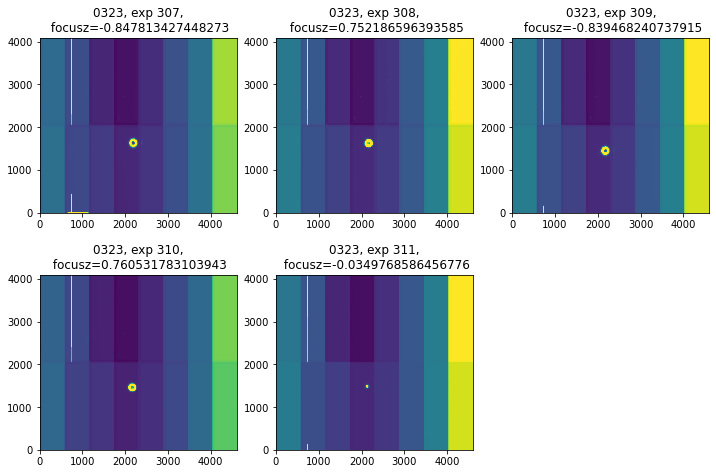

In [6]:
from lsst.daf import butler as dafButler
# analyze that for the test data 
preview_auxtel_exposures(monthDay='0323', expStart=307, expEnd=312)

They're all out of focus... Try another exposure...

It seems that https://confluence.lsstcorp.org/display/LSSTCOM/2021-10-05+Aux-Tel+Night+Log  should be out of focus, and then in-focus: 236-244

In [6]:
for exp in range(236,246):
    exposure = butler.get('raw', dataId={'instrument':'LATISS', 'detector':0, 
                                     'exposure':int(f'2021100500{exp}')
                                        },
                      collections=['LATISS/raw/all'])
    print(exp, exposure.getMetadata()['FOCUSZ'])

/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000236-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


236 -7.80175828933716


/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000237-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


237 -6.20175790786743


/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000238-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


238 -7.78534984588623


/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000239-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


239 -6.1853494644165


/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000240-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


240 -7.80017948150635


/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000241-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


241 -6.20017910003662


/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000242-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


242 -7.81224155426025


/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000243-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


243 -6.21224164962769


/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000244-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


244 -7.0172004699707


/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000245-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))


245 -7.0172004699707


Plot raws 

/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000236-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000237-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000238-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000239-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/lsstdata/offline/instrument/LATISS/storage/2021-10-05/AT_O_20211005_000240-R00S00.fits: outAmp.getRawBBox() != data.getBBox

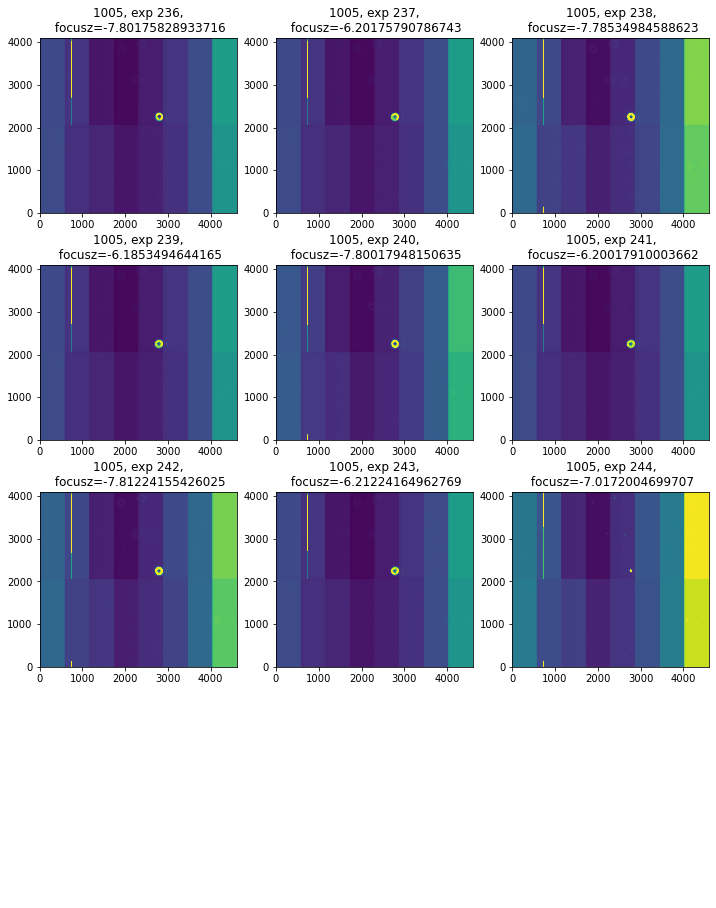

In [10]:
preview_auxtel_exposures(monthDay='1005', expStart=236, expEnd=245)

ok, that's the in-focus image:

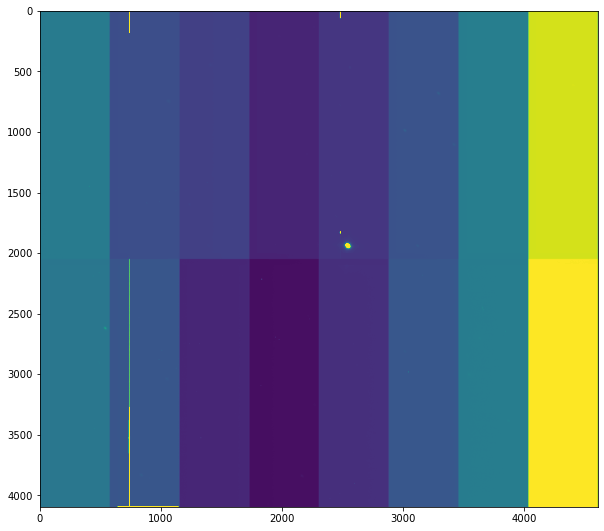

In [5]:
plt.figure(figsize=(10,10))
plt.imshow(data, vmin=vmin,vmax=vmax)

But all the defocal images are extra-focal (FOCUSZ < 0)... How can I find the intra-focal ones? 

Anyway, can run the WCS  on the in-focus one, and compare to the WCS attached to the exposure. Trying to use a similar method to https://github.com/lsst-ts/ts_phosim/blob/uw_dev/notebooks/analysis_notebooks/Create_wcs_from_phosim_out_of_focus_no_transpose.ipynb :

First, do the ISR:
    
    ssh lsst-devl02

    source "/software/lsstsw/stack/loadLSST.bash"
    setup lsst_distrib

    pipetask run  --data-query "exposure IN (2021090800483..2021090800489) AND instrument='LATISS' " -b /repo/main/butler.yaml --input  LATISS/raw/all,LATISS/calib,u/czw/DM-28920/calib.20210720  --output u/scichris/Latiss/postISRtest --pipeline /project/scichris/aos/testLatiss4_noFlat.yaml  --register-dataset-types
    
    
    

Show the postISR images:

In [3]:
from lsst.daf import butler as dafButler
instrument = 'LATISS'
dataId0 = dict(instrument=instrument)
repo_dir = '/repo/main/'
butler = dafButler.Butler(repo_dir, collections=['20211011T235508Z'])
                          
dataset = next(iter(
                butler.registry.queryDatasets(
                    datasetType='postISRCCD', 
                    collections=['u/scichris/Latiss/postISRtest'],
                    dataId=dataId0  )
                )
           )

expN = dataset.dataId["exposure"]


In [12]:
refs = []
for ref in butler.registry.queryDatasets(
                    datasetType='postISRCCD', 
                    collections=['u/scichris/Latiss/postISRtest'],
                    dataId=dataId0  ):
    refs.append(ref)

In [13]:
refs

[DatasetRef(DatasetType('postISRCCD', {band, instrument, detector, physical_filter, exposure}, Exposure), {instrument: 'LATISS', detector: 0, exposure: 2021032300307, ...}, id=b72dc194-804d-484b-ae2d-28566fc9f7e5, run='u/scichris/Latiss/postISRtest/20210930T214817Z'),
 DatasetRef(DatasetType('postISRCCD', {band, instrument, detector, physical_filter, exposure}, Exposure), {instrument: 'LATISS', detector: 0, exposure: 2021032300308, ...}, id=dc700912-a60f-4b1f-9125-2e84eab85862, run='u/scichris/Latiss/postISRtest/20210930T214817Z'),
 DatasetRef(DatasetType('postISRCCD', {band, instrument, detector, physical_filter, exposure}, Exposure), {instrument: 'LATISS', detector: 0, exposure: 2021032300309, ...}, id=04918d4f-79f5-4290-a121-56b01913d99d, run='u/scichris/Latiss/postISRtest/20210930T214817Z'),
 DatasetRef(DatasetType('postISRCCD', {band, instrument, detector, physical_filter, exposure}, Exposure), {instrument: 'LATISS', detector: 0, exposure: 2021032300310, ...}, id=bd25b1c3-f620-412

In [14]:
import numpy as np

In [4]:
from lsst.daf import butler as dafButler
postIsr = butler.get('postISRCCD', dataId={'instrument':'LATISS', 'detector':0, 
                                     'exposure':int(f'2021090800489')
                                        },
                      collections=['u/scichris/Latiss/postISRtest'])




In [5]:
postIsr.wcs

FITS standard SkyWcs:
Sky Origin: (307.0794913975, -87.4725165002)
Pixel Origin: (2088, 2006)
Pixel Scale: 0.095695 arcsec/pixel

Text(0.5, 1.0, 'postISRCCD, 2021090800489')

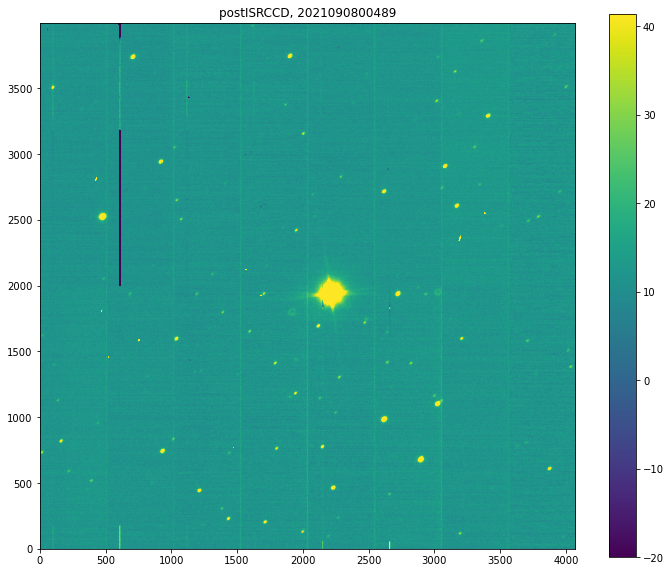

In [16]:
%matplotlib inline
from astropy.io import fits
from astropy.visualization import ZScaleInterval
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(12, 10))
zscale = ZScaleInterval()
data = postIsr.image.array
vmin, vmax = zscale.get_limits(data)
plt.imshow(data, origin='lower',vmin=vmin,vmax=vmax)
plt.colorbar()
plt.title('postISRCCD, 2021090800489')

Try to run the WCS code... 

Grab the sources from the reference catalog and plot on top of the image

In [6]:
# NB: this cell takes a while to run ...
from lsst.daf import butler as dafButler
butler = dafButler.Butler('/repo/main/', instrument='LATISS')
registry = butler.registry

deferredList = []
datasetGenerator = registry.queryDatasets(datasetType="gaia_dr2_20200414", 
                                          collections=["refcats"]).expanded()
for ref in datasetGenerator:
    deferredList.append(butler.getDeferred(ref, collections=["refcats"]))
    
    

KeyboardInterrupt: 

Instantiate generate donut catalog online task to get the reference object loader that way... 

In [18]:
from lsst.ts.wep.task.GenerateDonutCatalogOnlineTask import (GenerateDonutCatalogOnlineTask, 
                                                             GenerateDonutCatalogOnlineTaskConfig)

visitInfo = postIsr.getInfo().getVisitInfo()

donutCatConfig = GenerateDonutCatalogOnlineTaskConfig()
donutCatConfig.boresightRa = visitInfo.getBoresightRaDec().getRa().asDegrees()
donutCatConfig.boresightDec = visitInfo.getBoresightRaDec().getDec().asDegrees()
donutCatConfig.boresightRotAng = visitInfo.getBoresightRotAngle().asDegrees()
donutCatConfig.filterName = 'phot_g_mean'

In [19]:
# instantiate the task with the appropriate config 
donutCatTask = GenerateDonutCatalogOnlineTask(config=donutCatConfig)

In [20]:
#in https://github.com/lsst-ts/ts_phosim/blob/uw_dev/notebooks/analysis_notebooks/Create_wcs_from_phosim_out_of_focus_no_transpose.ipynb 
# refCatDir = '/astro/users/ajc26/epycuser/LSST-Commissioning/aoc/gaia_refcat'
# butler = Butler(refCatDir)
# refObjLoader = LoadIndexedReferenceObjectsTask(butler=butler)

# I do 
camera = "LATISS"
refObjLoader = donutCatTask.getRefObjLoader(deferredList)
refObjLoader.config.filterMap = {"g": "phot_g_mean" }


In [21]:
bbox = postIsr.getBBox()
wcs = postIsr.getWcs()
loadRes = refObjLoader.loadPixelBox(bbox=bbox, wcs=wcs, filterName="phot_g_mean")

root INFO: Loading reference objects from region bounded by [305.36434487, 308.82298656], [-87.54875820, -87.39704029] RA Dec
root INFO: Loaded 181 reference objects


In [22]:
import lsst.afw.table as afwTable
refCat = loadRes.refCat
refIdKey = refCat.schema["id"].asKey()
refRAKey = refCat.schema["coord_ra"].asKey()
refDecKey = refCat.schema["coord_dec"].asKey()
refCentroidKey = afwTable.Point2DKey(refCat.schema["centroid"])

In [23]:
refFluxRKey = refCat.schema["phot_rp_mean_flux"].asKey()

In [24]:
import lsst.meas.base as measBase
sourceSchema = afwTable.SourceTable.makeMinimalSchema()
measBase.SingleFrameMeasurementTask(schema=sourceSchema)  # expand the schema
sourceCat = afwTable.SourceCatalog(sourceSchema)
sourceCentroidKey = afwTable.Point2DKey(sourceSchema["slot_Centroid"])
sourceIdKey = sourceSchema["id"].asKey()
sourceRAKey = sourceSchema["coord_ra"].asKey()
sourceDecKey = sourceSchema["coord_dec"].asKey()
sourceInstFluxKey = sourceSchema["slot_ApFlux_instFlux"].asKey()
sourceInstFluxErrKey = sourceSchema["slot_ApFlux_instFluxErr"].asKey()



In [25]:
sourceCat.reserve(len(refCat))
for refObj in refCat:
    src = sourceCat.addNew()
    src.set(sourceIdKey, refObj.get(refIdKey))
    src.set(sourceRAKey, refObj.get(refRAKey))
    src.set(sourceDecKey, refObj.get(refDecKey))

    src.set(sourceCentroidKey, refObj.get(refCentroidKey))
    src.set(sourceInstFluxKey, refObj.get(refFluxRKey))
    src.set(sourceInstFluxErrKey, refObj.get(refFluxRKey)/100)

In [23]:
def makeSourceCat(bbox, distortedWcs, refObjLoader):
    """Make a source catalog by reading the position reference stars and distorting the positions
    """
    loadRes = refObjLoader.loadPixelBox(bbox=bbox, wcs=distortedWcs, filterName="phot_rp_mean")
    refCat = loadRes.refCat
    refIdKey = refCat.schema["id"].asKey()
    refRAKey = refCat.schema["coord_ra"].asKey()
    refDecKey = refCat.schema["coord_dec"].asKey()
    refCentroidKey = afwTable.Point2DKey(refCat.schema["centroid"])
    refFluxRKey = refCat.schema["phot_rp_mean_flux"].asKey()

    sourceSchema = afwTable.SourceTable.makeMinimalSchema()
    measBase.SingleFrameMeasurementTask(schema=sourceSchema)  # expand the schema
    sourceCat = afwTable.SourceCatalog(sourceSchema)
    sourceCentroidKey = afwTable.Point2DKey(sourceSchema["slot_Centroid"])
    sourceIdKey = sourceSchema["id"].asKey()
    sourceRAKey = sourceSchema["coord_ra"].asKey()
    sourceDecKey = sourceSchema["coord_dec"].asKey()
    sourceInstFluxKey = sourceSchema["slot_ApFlux_instFlux"].asKey()
    sourceInstFluxErrKey = sourceSchema["slot_ApFlux_instFluxErr"].asKey()

    sourceCat.reserve(len(refCat))
    for refObj in refCat:
        src = sourceCat.addNew()
        src.set(sourceIdKey, refObj.get(refIdKey))
        src.set(sourceRAKey, refObj.get(refRAKey))
        src.set(sourceDecKey, refObj.get(refDecKey))

        src.set(sourceCentroidKey, refObj.get(refCentroidKey))
        src.set(sourceInstFluxKey, refObj.get(refFluxRKey))
        src.set(sourceInstFluxErrKey, refObj.get(refFluxRKey)/100)
    return sourceCat

In [26]:
visitInfo.get

AttributeError: 'lsst.afw.image._imageLib.VisitInfo' object has no attribute 'get'

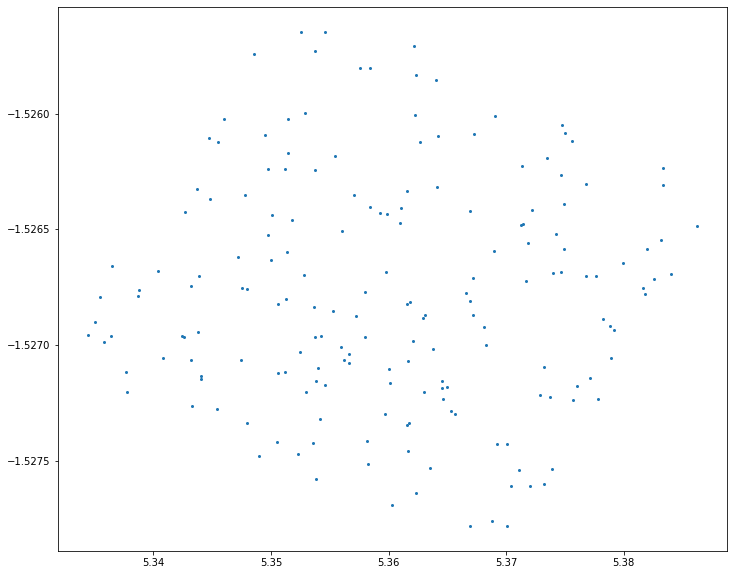

In [28]:
img = postIsr
#gaiaCat = makeSourceCat(img.getBBox(), img.getWcs(), refObjLoader)
xcen = sourceCat['slot_Centroid_x']
ycen = sourceCat['slot_Centroid_y']
ra = sourceCat['coord_ra']
dec = sourceCat['coord_dec']
#plt.text(ra.mean(), dec.mean(), 'RXX_S00' )#"{}".format(det))
fig = plt.figure(figsize=(12, 10))
# zscale = ZScaleInterval()
# data = postIsr.image.array
# vmin, vmax = zscale.get_limits(data)
# plt.imshow(data, origin='lower',vmin=vmin,vmax=vmax)
# plt.colorbar()
# plt.title('postISRCCD, 2021090800489')
plt.scatter(ra,dec,s=4)

In [20]:
x,y = wcs.skyToPixelArray(ra,dec)

Text(0.5, 1.0, 'postISRCCD, 2021090800489')

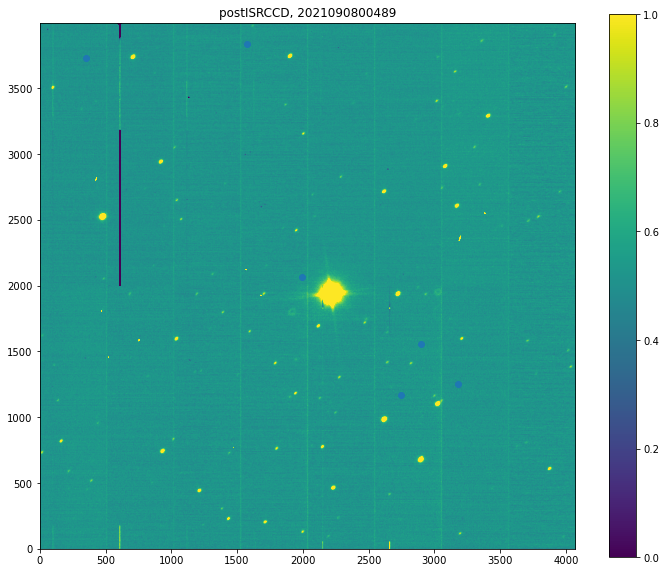

In [46]:
zscale = ZScaleInterval()
data = postIsr.image.array
vmin, vmax = zscale.get_limits(data)
fig = plt.figure(figsize=(12, 10))

select = (mags<15) & (mags>1)

plt.imshow(data, origin='lower',vmin=vmin,vmax=vmax)
plt.scatter(y[select],x[select])
plt.colorbar()
plt.title('postISRCCD, 2021090800489')

<bound method PyCapsule.getCdMatrix of FITS standard SkyWcs:
Sky Origin: (307.0794913975, -87.4725165002)
Pixel Origin: (2088, 2006)
Pixel Scale: 0.095695 arcsec/pixel>

In [39]:
data

array([[  5.6577907 ,  13.905122  ,  14.800974  , ...,   4.965854  ,
         31.436356  ,  13.111629  ],
       [ 11.201324  ,  12.107666  ,  22.476854  , ...,   7.959168  ,
         10.578522  ,   8.235064  ],
       [ 17.105598  ,  -1.3379277 ,  19.281813  , ...,  -0.03641888,
          1.4927887 ,  26.563267  ],
       ...,
       [ -2.7542415 ,   8.618264  ,  14.168835  , ..., -10.292757  ,
         -5.8691072 ,  13.471566  ],
       [ -3.8854842 ,   8.475467  ,  15.84938   , ...,  28.071009  ,
         20.062754  ,  15.029114  ],
       [  2.4389756 ,  15.94829   ,  27.166012  , ...,  -2.4083216 ,
         18.036201  ,  21.97865   ]], dtype=float32)

In [31]:
# I believe flux is in nanoJanskys 
# https://github.com/lsst/meas_algorithms/blob/2eca8e6affe861eb8ff1adaf11d13d679d3912e6/python/lsst/meas/algorithms/loadReferenceObjects.py#L505
# -2.5*np.log10(1e-9) = 22.5
# the formula https://en.wikipedia.org/wiki/AB_magnitude
# is for flux in Jy:
# mags = -2.5 *log10(flux[Jy]) + 8.9
# nJy = 1e-9 Jy
# so flux[nJy] = 1e-9 flux[Jy]
#mags= -2.5*np.log10(donutCatalog['source_flux'])+22.5 +8.9


# another way:
# https://github.com/lsst-ts/ts_wep/blob/08d0c2c4c0f6ed37fcc86af9ac09386469ae8824/python/lsst/ts/wep/bsc/LocalDatabaseFromRefCat.py#L112
# mag_list = (ranked_ref_cat_df['phot_g_mean_flux'].values * u.nJy).to(u.ABmag)
#             ranked_ref_cat_df['mag'] = np.array(mag_list)
        
mags = -2.5*np.log10(sourceCat['slot_ApFlux_instFlux'])+22.5+8.9

/tmp/ipykernel_700419/1946843222.py:11: RuntimeWarning: divide by zero encountered in log10
  mags = -2.5*np.log10(sourceCat['slot_ApFlux_instFlux'])+22.5+8.9


In [219]:
import astropy.units as u
mag_list = (sourceCat['slot_ApFlux_instFlux'] * u.nJy).to(u.ABmag)
mag_array = np.array(mag_list)

/software/lsstsw/stack_20210813/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe/lib/python3.8/site-packages/astropy/units/function/logarithmic.py:46: RuntimeWarning: divide by zero encountered in log10
  return dex.to(self._function_unit, np.log10(x))


(array([ 9.,  0.,  0.,  1.,  0.,  0.,  5., 23., 67., 76.]),
 array([ 0.        ,  2.12275235,  4.2455047 ,  6.36825706,  8.49100941,
        10.61376176, 12.73651411, 14.85926646, 16.98201882, 19.10477117,
        21.22752352]),
 <BarContainer object of 10 artists>)

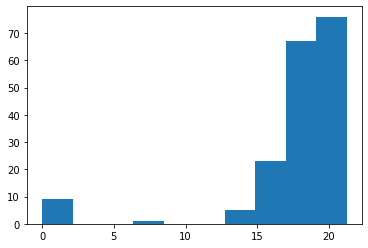

In [149]:
mag_array[np.isinf(mag_array)] = 0 
plt.hist(mag_array)

In [36]:
mags[np.isinf(mags)] = 0 

(array([ 9.,  0.,  0.,  1.,  0.,  0.,  5., 23., 67., 76.]),
 array([ 0.        ,  2.12275235,  4.2455047 ,  6.36825706,  8.49100941,
        10.61376176, 12.73651411, 14.85926646, 16.98201882, 19.10477117,
        21.22752352]),
 <BarContainer object of 10 artists>)

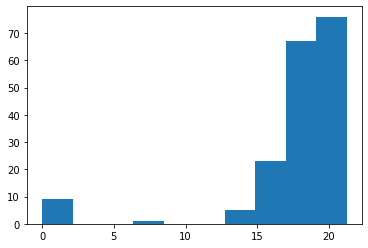

In [37]:
plt.hist(mags)

In [59]:
img.getDimensions()

Extent2I(4072, 4000)

Try plotting  in ra,dec projection:

Using exposure-attached WCS


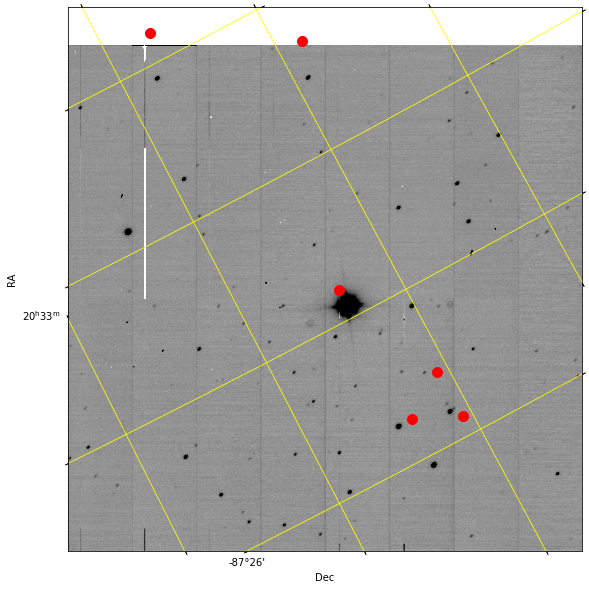

In [156]:
from astropy.wcs import WCS
from astropy.io import fits
from astropy.visualization import ZScaleInterval
import astropy.units as u

def plotRaDec(postIsrExp, wcs=None):
    
    """
    Plot the image data and the WCS overlay.
    
    Parameters
    ----------
    postIsrExp : lsst.afw.image.Exposure
        The post-ISR exposure from the butler repository.
    """
    # Get the WCS for the projection
    
    if wcs is None:
        print('Using exposure-attached WCS')
        wcs = postIsrExp.getWcs()
    else:
        print('Using provided WCS ')
    header_dict = dict(wcs.getFitsMetadata())
    
    # Add in axis information
    header_dict['NAXIS'] = 2
    header_dict['NAXIS1'] = postIsrExp.getDimensions()[0]
    header_dict['NAXIS2'] = postIsrExp.getDimensions()[1]
    
    # Convert to astropy readable WCS
    astropyWcs = WCS(header_dict)
    
    # Grab image data and plot
    data = postIsrExp.getImage().getArray()
    zscale = ZScaleInterval()
    vmin, vmax = zscale.get_limits(data)

    plt.subplot(projection=astropyWcs)#, slices=('y', 'x'))
    plt.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys',)

    # Format coordinates presentation
    ax = plt.gca()

    # Fix axis label issue (https://github.com/astropy/astropy/issues/7180)
    ax.coords[0].set_ticklabel_position('l')
    ax.coords[0].grid(color='yellow')
    ax.set_ylabel('RA')
    
    ax.coords[1].set_ticklabel_position('b')
    ax.coords[1].grid(color='yellow')
    ax.set_xlabel('Dec')
    
fig = plt.figure(figsize=(10,10))    
plotRaDec(img)
plt.scatter(y[select],x[select],c='red', s=100)

In [55]:
wcs.getCdMatrix()

array([[-2.35062451e-05, -1.24119382e-05],
       [ 1.24119382e-05, -2.35062451e-05]])

In [67]:
wcs.isFlipped

True

In [71]:
wcs.getPixelScale

<bound method PyCapsule.getPixelScale of FITS standard SkyWcs:
Sky Origin: (307.0794913975, -87.4725165002)
Pixel Origin: (2088, 2006)
Pixel Scale: 0.095695 arcsec/pixel>

In [73]:
wcs.getSkyOrigin()

SpherePoint(307.079491397524*geom.degrees, -87.47251650024621*geom.degrees)

In [76]:
wcs.getPixelOrigin

<bound method PyCapsule.getPixelOrigin of FITS standard SkyWcs:
Sky Origin: (307.0794913975, -87.4725165002)
Pixel Origin: (2088, 2006)
Pixel Scale: 0.095695 arcsec/pixel>

Make a newWCS with slightly different rotation:

In [66]:
info = img.getInfo().getVisitInfo()
info.getBoresightRotAngle().asDegrees()

207.835275335279

This would reproduce exactly the original WCS : 

In [77]:
import lsst.geom
from lsst.afw.geom import makeSkyWcs,  makeCdMatrix
orientation = info.getBoresightRotAngle()# 0 * lsst.geom.degrees  # 
flipX = True
scale =  wcs.getPixelScale() # 0.2 * lsst.geom.arcseconds  # how many arcsec per pixel 
cdMatrix = makeCdMatrix(scale=scale, orientation=orientation, flipX=flipX)

# crval  - `lsst.geom.SpherePoint`  Desired reference sky position.
# crpix = lsst.geom.Point2D(100, 100) - pixel corresponding ot the origin 

crpix = wcs.getPixelOrigin() #lsst.geom.Point2D(2188.5, 2224.5)
crval = wcs.getSkyOrigin() # lsst.geom.SpherePoint(0.0*lsst.geom.degrees, 0.0*lsst.geom.degrees)
newWcs = makeSkyWcs(crpix=crpix, crval=crval, cdMatrix=cdMatrix)

In [78]:
newWcs

FITS standard SkyWcs:
Sky Origin: (307.0794913975, -87.4725165002)
Pixel Origin: (2088, 2006)
Pixel Scale: 0.095695 arcsec/pixel

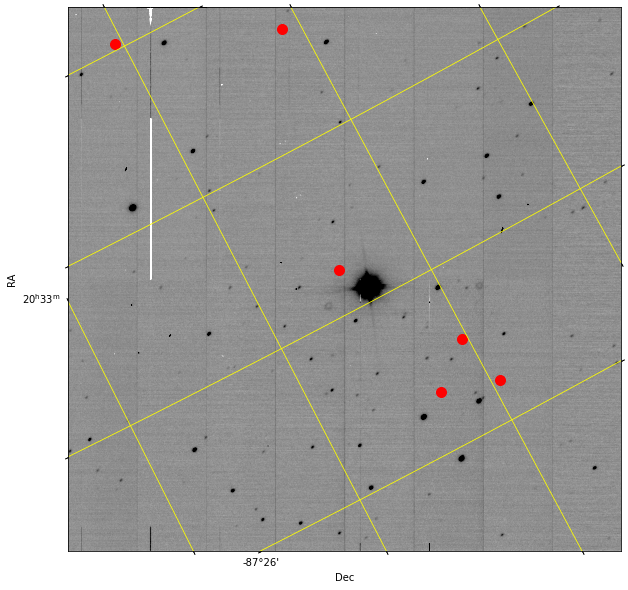

In [79]:
fig = plt.figure(figsize=(10,10))    
plotRaDec(img)
plt.scatter(y[select],x[select],c='red', s=100)

Now change the rotation angle by 30 deg... 

In [107]:
wcs.getPixelOrigin()[0]

2088.0000000000005

Using provided WCS 


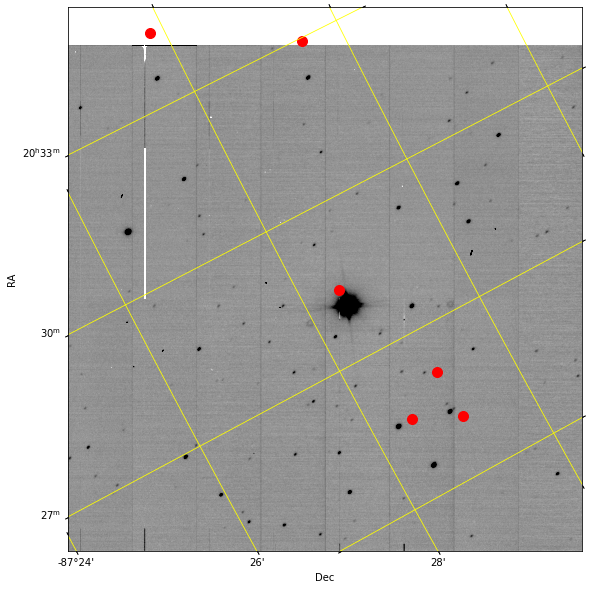

In [157]:
import lsst.geom
from lsst.afw.geom import makeSkyWcs,  makeCdMatrix
def makeNewWcs(wcs, img, rotationInDeg, pxOriginShift=[0,0]):
    
    info = img.getInfo().getVisitInfo()
    orientation = (info.getBoresightRotAngle().asDegrees()+\
                   rotationInDeg)* lsst.geom.degrees#  info.getBoresightRotAngle()# 0 * lsst.geom.degrees  # 
    flipX = True
    scale =  wcs.getPixelScale() # 0.2 * lsst.geom.arcseconds  # how many arcsec per pixel 
    cdMatrix = makeCdMatrix(scale=scale, orientation=orientation, flipX=flipX)

    # crval  - `lsst.geom.SpherePoint`  Desired reference sky position.
    # crpix = lsst.geom.Point2D(100, 100) - pixel corresponding ot the origin 
    #if pxOriginShift is None:
    
    pxOrigin = wcs.getPixelOrigin()
    
    crpix =  lsst.geom.Point2D(pxOrigin[0]+pxOriginShift[0],
                               pxOrigin[1]+pxOriginShift[1])#lsst.geom.Point2D(2188.5, 2224.5)
    
    crval = wcs.getSkyOrigin() # lsst.geom.SpherePoint(0.0*lsst.geom.degrees, 0.0*lsst.geom.degrees)
    newWcs = makeSkyWcs(crpix=crpix, crval=crval, cdMatrix=cdMatrix)
    return newWcs

newWcs = makeNewWcs(wcs,img,rotationInDeg=-90)
fig = plt.figure(figsize=(10,10))    
plotRaDec(img,wcs=newWcs)
plt.scatter(y[select],x[select],c='red', s=100)

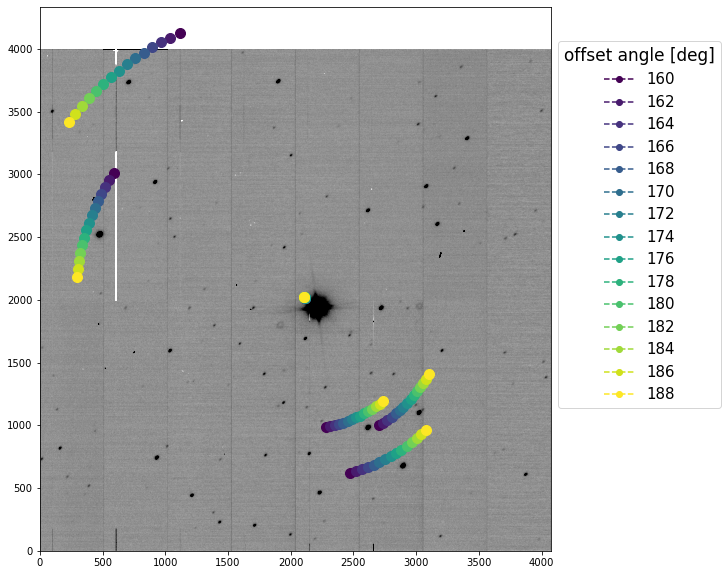

In [149]:
import matplotlib.lines as mlines
data = img.getImage().getArray()
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(data)
fig,ax = plt.subplots(figsize=(10,10))
#plt.subplot(projection=astropyWcs)#, slices=('y', 'x'))
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')


i = 0 
angles =  np.arange(160,190,2)
n_dots = len(angles)
color_idx = np.linspace(0, 1, n_dots)
ax_legend_handles = []

for angle in angles:
    
    newWcs = makeNewWcs(wcs, angle, pxOriginShift=[0,0])
    x,y = newWcs.skyToPixelArray(ra,dec)
    color = plt.cm.viridis(color_idx[i])
    ax.scatter(x[select],y[select],s=100,color=color)
    line = mlines.Line2D([], [], color=color, ls='--', marker='o', alpha=1,
                                 label=str(angle))
    ax_legend_handles.append(line)
        
    i += 1 
plt.legend(bbox_to_anchor=(1,0.6),title='offset angle [deg]',
           fancybox=True, loc="center left",
           handles = ax_legend_handles, ncol=1,
          fontsize=15,title_fontsize=17)
#plt.legend()

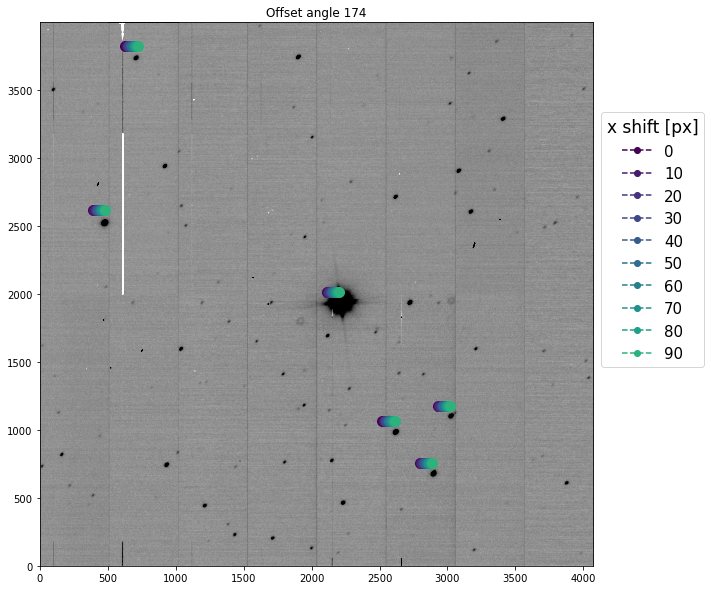

In [150]:
data = img.getImage().getArray()
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(data)
fig,ax = plt.subplots(figsize=(10,10))
#plt.subplot(projection=astropyWcs)#, slices=('y', 'x'))
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')


i = 0 
shifts =  np.arange(0,100,10)
n_dots = len(angles)
color_idx = np.linspace(0, 1, n_dots)
ax_legend_handles = []
angle = 174
for shift in shifts:
    
    newWcs = makeNewWcs(wcs, angle, pxOriginShift=[shift,0])
    x,y = newWcs.skyToPixelArray(ra,dec)
    color = plt.cm.viridis(color_idx[i])
    ax.scatter(x[select],y[select],s=100,color=color)
    line = mlines.Line2D([], [], color=color, ls='--', marker='o', alpha=1,
                                 label=str(shift))
    ax_legend_handles.append(line)
    i += 1 
ax.set_title(f'Offset angle {angle}')
plt.legend(bbox_to_anchor=(1,0.6),title='x shift [px]',
           fancybox=True, loc="center left",
           handles = ax_legend_handles, ncol=1,
          fontsize=15,title_fontsize=17)

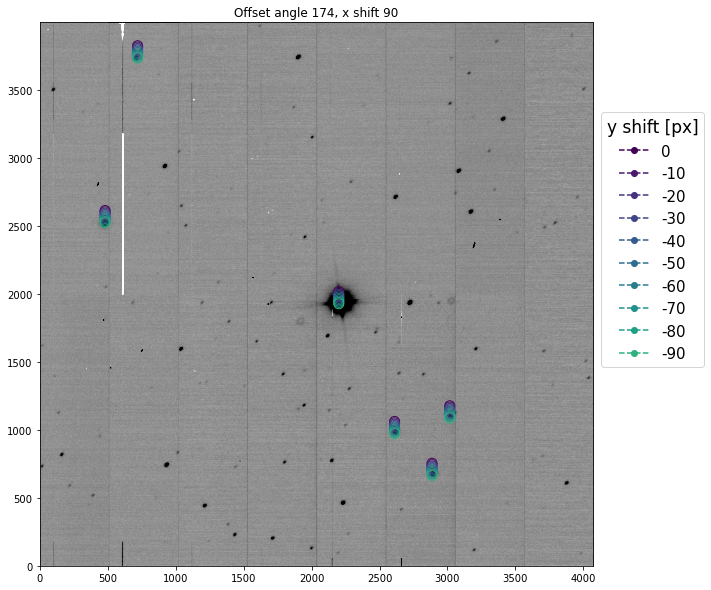

In [153]:
data = img.getImage().getArray()
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(data)
fig,ax = plt.subplots(figsize=(10,10))
#plt.subplot(projection=astropyWcs)#, slices=('y', 'x'))
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')


i = 0 
yshifts =  np.arange(0,100,10)
n_dots = len(angles)
color_idx = np.linspace(0, 1, n_dots)
ax_legend_handles = []
angle = 174
xshift = 90
for yshift in -yshifts:
    
    newWcs = makeNewWcs(wcs, angle, pxOriginShift=[xshift,yshift])
    x,y = newWcs.skyToPixelArray(ra,dec)
    color = plt.cm.viridis(color_idx[i])
    ax.scatter(x[select],y[select],s=100,facecolors='none', edgecolors=color, )
    line = mlines.Line2D([], [], color=color, ls='--', marker='o', alpha=1,
                                 label=str(yshift))
    ax_legend_handles.append(line)
    i += 1 
ax.set_title(f'Offset angle {angle}, x shift {xshift}', fontsize=18)

plt.legend(bbox_to_anchor=(1,0.6),title='y shift [px]',
           fancybox=True, loc="center left",
           handles = ax_legend_handles, ncol=1,
          fontsize=15,title_fontsize=17)

So if I use a wcs angle of 174 deg, and x,y offset of [90,-90] px, I get:

In [34]:
img

Text(0.5, 1.0, 'Offset angle 174 degrees, \n x,y shift (90,-90) px')

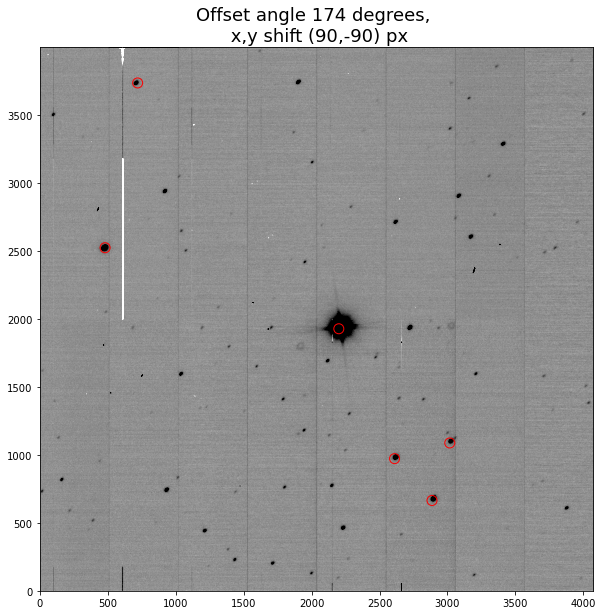

In [157]:
import matplotlib.lines as mlines
data = img.getImage().getArray()
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(data)
fig,ax = plt.subplots(figsize=(10,10))
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')
angle = 174
xshift=90
yshift=-90

newWcs = makeNewWcs(wcs, angle, pxOriginShift=[xshift,yshift])
x,y = newWcs.skyToPixelArray(ra,dec)

ax.scatter(x[select],y[select],s=100,facecolors='none', edgecolors='red',)
ax.set_title(f'Offset angle {angle} degrees, \n x,y shift ({xshift},{yshift}) px', fontsize=18)

# Run astrometry task

Try shifting WCS by 180 degrees, and pass it to astrometry which should be able to handle the rest, based on https://github.com/lsst-ts/ts_phosim/blob/uw_dev/notebooks/analysis_notebooks/Create_wcs_from_phosim_out_of_focus_no_transpose.ipynb

Seems that I need to run the source detection task first ... 

In [41]:
charImageTask.installSimplePsf.fw

In [42]:
from lsst.pipe.tasks.characterizeImage import CharacterizeImageTask, CharacterizeImageConfig

#Set up the task, it requires a config when we instantiate it
charConfig = CharacterizeImageConfig()

charImageTask = CharacterizeImageTask(None, config=charConfig)
charImageTask.installSimplePsf.fwhm=2
#run the task on our exposure and save the output. This takes a minute to run 
charResult = charImageTask.run(img)

/software/lsstsw/stack_20210813/stack/miniconda3-py38_4.9.2-0.7.0/Linux64/meas_algorithms/22.0.1-24-g3793161d+52c4bb8db7/python/lsst/meas/algorithms/installGaussianPsf.py:77: FutureWarning: Default position argument overload is deprecated and will be removed in version 24.0.  Please explicitly specify a position.
  psfSigma = psfModel.computeShape().getDeterminantRadius()
/software/lsstsw/stack_20210813/stack/miniconda3-py38_4.9.2-0.7.0/Linux64/meas_algorithms/22.0.1-24-g3793161d+52c4bb8db7/python/lsst/meas/algorithms/installGaussianPsf.py:78: FutureWarning: Default position argument overload is deprecated and will be removed in version 24.0.  Please explicitly specify a position.
  width, height = psfModel.computeImage().getDimensions()


LengthError: 
  File "src/CR.cc", line 409, in std::vector<std::shared_ptr<lsst::afw::detection::Footprint> > lsst::meas::algorithms::findCosmicRays(MaskedImageT&, const lsst::afw::detection::Psf&, double, const lsst::daf::base::PropertySet&, bool) [with MaskedImageT = lsst::afw::image::MaskedImage<float>]
    Too many CR pixels (max 10000) {0}
lsst::pex::exceptions::LengthError: 'Too many CR pixels (max 10000)'


Define the PSF, since 'characterizeImage' can't figure it out ... 

In [44]:
def gkern(l=3, sig=0.5):
    """\
    creates gaussian kernel with side length l and a sigma of sig
    """

    ax = np.linspace(-(l - 1) / 2., (l - 1) / 2., l)
    xx, yy = np.meshgrid(ax, ax)

    kernel = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sig))

    return kernel / np.sum(kernel)
#Run detection and measure on the correlated image using the simple PSF
#NOTE should look at which centroid is run to see if there are better ones
psf_array = gkern(l=11, sig=2.5)
# #psf_array = gkern(l=5, sig=0.5)
psf_array = psf_array.astype(np.float64)
psf_image = lsst.afw.image.ImageD(psf_array)
psf_kernel = lsst.afw.math.FixedKernel(psf_image)
psf = lsst.meas.algorithms.KernelPsf(psf_kernel)

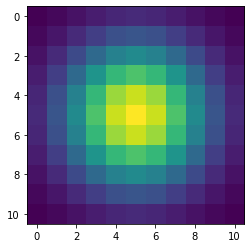

In [46]:
plt.imshow(psf_image.array)

In [113]:
exposure = deepcopy(img)

In [114]:
oldWcs = exposure.getWcs()

In [115]:
oldWcs

FITS standard SkyWcs:
Sky Origin: (307.0794913975, -87.4725165002)
Pixel Origin: (2088, 2006)
Pixel Scale: 0.095695 arcsec/pixel

Run source detection:

In [116]:
#Use DM tasks to run: detection, measure using the simple PSF (no deblending)
#From Merlin: It's usually a good idea to construct all Tasks before using any of them, mostly
# to define the full schema of any catalogs we'll produce up front.

schema = lsst.afw.table.SourceTable.makeMinimalSchema()

configDetection = SourceDetectionTask.ConfigClass()
configDetection.thresholdValue = 10 #30  # detection threshold in units of thresholdType
configDetection.thresholdType = "stdev"#"stdev"   # units for thresholdValue
configDetection.minPixels = 200 # 1000
#configDetection.minPixels = 10
detect = lsst.meas.algorithms.SourceDetectionTask(schema=schema, config=configDetection)


measure = lsst.meas.base.SingleFrameMeasurementTask(schema=schema)
table = lsst.afw.table.SourceTable.make(schema)  # this is really just a factory for records, not a table

#create copy of image 
from copy import deepcopy
exposure = deepcopy(img)
exposure.setPsf(psf)

# Run the detect the measure tasks
detect_result = detect.run(table, exposure)

catalog = detect_result.sources   # this is the actual catalog, but most of it's still empty
measure.run(catalog, exposure)

/software/lsstsw/stack_20210813/stack/miniconda3-py38_4.9.2-0.7.0/Linux64/meas_algorithms/22.0.1-24-g3793161d+52c4bb8db7/python/lsst/meas/algorithms/detection.py:409: FutureWarning: Default position argument overload is deprecated and will be removed in version 24.0.  Please explicitly specify a position.
  sigma = psf.computeShape().getDeterminantRadius()
/software/lsstsw/stack_20210813/stack/miniconda3-py38_4.9.2-0.7.0/Linux64/meas_algorithms/22.0.1-24-g3793161d+52c4bb8db7/python/lsst/meas/algorithms/detection.py:446: FutureWarning: Default position argument overload is deprecated and will be removed in version 24.0.  Please explicitly specify a position.
  sigma = psf.computeShape().getDeterminantRadius()


In [117]:
catalog

<class 'lsst.afw.table.SourceCatalog'>
 id      coord_ra           coord_dec      ... base_Variance_value base_Variance_flag_emptyFootprint
           rad                 rad         ...                                                      
--- ------------------ ------------------- ... ------------------- ---------------------------------
  1  5.382608753081699 -1.5261971231687763 ...                 nan                              True
  2  5.368448133273105 -1.5258659784493773 ...  1.8332655429840088                             False
  3 5.3638318542759595 -1.5257523491000802 ...                 nan                              True
  4  5.358580206484615 -1.5256701011136846 ...  1.9161406755447388                             False
  5 5.3694488010912815 -1.5259324848331641 ...   1.368666172027588                             False
  6  5.371736163029765 -1.5260231271729028 ...                 nan                              True
  7 5.3741834833576725 -1.5260925734926467 ...  1.61

Plot the catalog on top of the image 

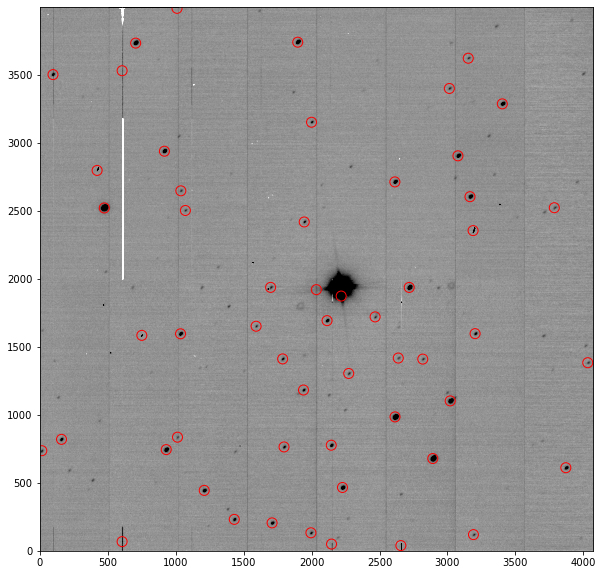

In [118]:
data = img.getImage().getArray()
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(data)
fig,ax = plt.subplots(figsize=(10,10))
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')
ax.scatter(catalog['slot_Centroid_x'], catalog['slot_Centroid_y'],s=100,facecolors='none', edgecolors='red',)

In [83]:
cat = catalog.asAstropy()

In [85]:
cat.colnames

['id',
 'coord_ra',
 'coord_dec',
 'parent',
 'base_NaiveCentroid_x',
 'base_NaiveCentroid_y',
 'base_NaiveCentroid_flag',
 'base_NaiveCentroid_flag_noCounts',
 'base_NaiveCentroid_flag_edge',
 'base_NaiveCentroid_flag_resetToPeak',
 'base_SdssCentroid_x',
 'slot_Centroid_x',
 'base_SdssCentroid_y',
 'slot_Centroid_y',
 'base_SdssCentroid_xErr',
 'slot_Centroid_xErr',
 'base_SdssCentroid_yErr',
 'slot_Centroid_yErr',
 'base_SdssCentroid_flag',
 'base_CircularApertureFlux_flag_badCentroid',
 'base_GaussianFlux_flag_badCentroid',
 'base_LocalBackground_flag_badCentroid',
 'base_NaiveCentroid_flag_badInitialCentroid',
 'base_PsfFlux_flag_badCentroid',
 'base_SdssShape_flag_badCentroid',
 'base_Variance_flag_badCentroid',
 'slot_Centroid_flag',
 'base_SdssCentroid_flag_edge',
 'base_CircularApertureFlux_flag_badCentroid_edge',
 'base_GaussianFlux_flag_badCentroid_edge',
 'base_LocalBackground_flag_badCentroid_edge',
 'base_NaiveCentroid_flag_badInitialCentroid_edge',
 'base_PsfFlux_flag_ba

ok, with the sources detected at the right places, run astrometry matching:

In [120]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import lsst.utils.tests
import lsst.geom
import lsst.afw.geom as afwGeom
import lsst.afw.table as afwTable
import lsst.afw.image as afwImage
import lsst.meas.base as measBase
from lsst.daf.persistence import Butler
from lsst.meas.algorithms import LoadIndexedReferenceObjectsTask, MagnitudeLimit
from lsst.meas.algorithms.detection import SourceDetectionTask
from lsst.afw.image.utils import defineFilter
from lsst.meas.astrom import AstrometryTask
import lsst.afw.display as afwDisplay



astromConfig = AstrometryTask.ConfigClass()
# Pick your retarget here if necessary
# astromConfig.wcsFitter.retarget(FitAffineWcsTask)
# astromConfig.wcsFitter.retarget(FitTanSipWcsTask)
# astromConfig.referenceSelector.doMagLimit = False
#    You probably *do* want to do a mag limit, because your donuts are
#    unlikely to go as deep as GAIA, and if you have too much choice the matcher
#    will always succeed, but finding false matches with huge scatter.
magLimit = MagnitudeLimit()
magLimit.minimum = 10
magLimit.maximum = 16
astromConfig.referenceSelector.magLimit = magLimit
astromConfig.referenceSelector.magLimit.fluxField = "phot_g_mean_flux"
astromConfig.matcher.minMatchedPairs = 4
astromConfig.matcher.maxRotationDeg = 5.99
astromConfig.matcher.maxOffsetPix = 100
astromConfig.wcsFitter.order = 2
astromConfig.wcsFitter.numRejIter = 0
astromConfig.wcsFitter.maxScatterArcsec = 15


Need to redefine filter label ... 

In [119]:
# this is a bit sleezy (as RHL would say) but I'm just forcing the exposure
# to have the same name as the one in the Gaia catalog for now

# this method of making a filter doesn't work anymore ...
# "defineFilter" is deprecated ... 
# referenceFilterName = 'phot_g_mean'
# defineFilter(referenceFilterName, 656.28)
# referenceFilter = afwImage.Filter(referenceFilterName)
# exposure.setFilter(referenceFilter)

# the shift is described  here 
# https://community.lsst.org/t/afw-image-filter-is-now-deprecated/4675 
from lsst.afw.image import FilterLabel
exposure.setFilterLabel(FilterLabel('phot_g_mean'))

NB: need to rotate the WCS attached to the exposure by 180 degrees before running the reference object matching 

In [167]:
wcs.getCdMatrix()

array([[-2.08688567e-05, -1.62451562e-05],
       [ 1.42689338e-05, -2.28226852e-05]])

In [163]:
import lsst.geom
from lsst.afw.geom import makeSkyWcs,  makeCdMatrix


wcs = exposure.getWcs()
rotationInDeg = 180 

info = exposure.getInfo().getVisitInfo()
orientation = (info.getBoresightRotAngle().asDegrees()+\
               rotationInDeg)* lsst.geom.degrees#  info.getBoresightRotAngle()# 0 * lsst.geom.degrees  # 
flipX = True
scale =  wcs.getPixelScale() # 0.2 * lsst.geom.arcseconds  # how many arcsec per pixel 
cdMatrix = makeCdMatrix(scale=scale, orientation=orientation, flipX=flipX)

# crval  - `lsst.geom.SpherePoint`  Desired reference sky position.
# crpix = lsst.geom.Point2D(100, 100) - pixel corresponding ot the origin 
#if pxOriginShift is None:

pxOrigin = wcs.getPixelOrigin()

crpix = pxOrigin#  lsst.geom.Point2D(pxOrigin[0]+pxOriginShift[0],
                  #         pxOrigin[1]+pxOriginShift[1])#lsst.geom.Point2D(2188.5, 2224.5)

crval = wcs.getSkyOrigin() # lsst.geom.SpherePoint(0.0*lsst.geom.degrees, 0.0*lsst.geom.degrees)
newWcs = makeSkyWcs(crpix=crpix, crval=crval, cdMatrix=cdMatrix)

In [168]:
newWcs.getCdMatrix()

array([[ 2.35310821e-05,  1.24250528e-05],
       [-1.24250528e-05,  2.35310821e-05]])

In [170]:
exposure.setWcs(newWcs)

Show the reference  catalog sources plotted using this wcs:

Text(0.5, 1.0, 'Original WCS rotated by 180 degrees,\n (ra,dec)-->(x,y) for reference catalog bright sources')

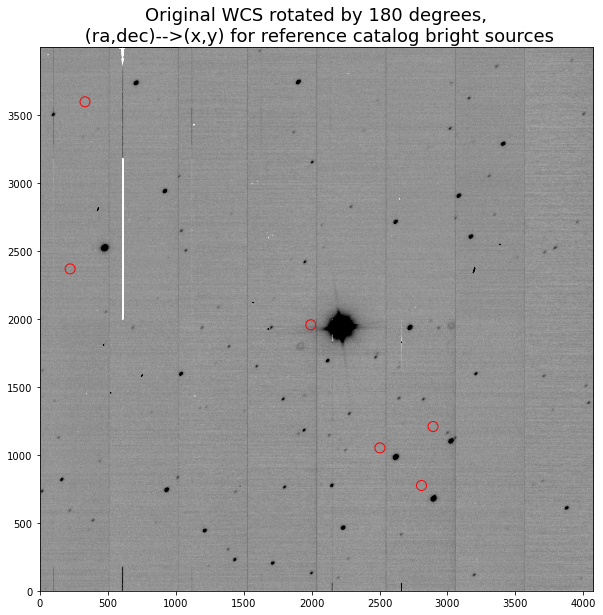

In [181]:
import lsst.geom
from lsst.afw.geom import makeSkyWcs,  makeCdMatrix

data = exposure.getImage().getArray()
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(data)
fig,ax = plt.subplots(figsize=(10,10))
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')
angle = rotationInDeg

x,y = newWcs.skyToPixelArray(ra,dec)

ax.scatter(x[select],y[select],s=100,facecolors='none', edgecolors='red',)
ax.set_title(f'Original WCS rotated by {angle} degrees,\n (ra,dec)-->(x,y) for reference catalog bright sources', fontsize=18)


As we can see, there's an offset, but the large rotation has been taken care of. 

Now run the astrometry solver matching the detected sources against the reference objects catalog:

In [182]:

schema = lsst.afw.table.SourceTable.makeMinimalSchema()
solver = AstrometryTask(config=astromConfig, refObjLoader=refObjLoader, schema=schema,)
results = solver.run(sourceCat=catalog, exposure=exposure,)

root INFO: Loading reference objects from region bounded by [305.32816090, 308.66801525], [-87.54230654, -87.39591385] RA Dec
root INFO: Loaded 173 reference objects
root INFO: Correcting reference catalog for proper motion to <Time object: scale='tai' format='mjd' value=59466.24454000155>


Here's where the code that did something similar  is  available... 
https://github.com/lsst-ts/ts_wep/blob/uw_dev/python/lsst/ts/wep/bsc/LocalDatabaseFromRefCat.py

It seems from reading it that the solver updates the WCS information. Print the new WCS and compare to the old one:

In [183]:
updatedWcs = exposure.getWcs()

In [184]:
print(updatedWcs)

FITS standard SkyWcs:
Sky Origin: (306.9960657233, -87.4743059906)
Pixel Origin: (2072.47, 1809.96)
Pixel Scale: 0.0957562 arcsec/pixel


In [185]:
print(newWcs)

FITS standard SkyWcs:
Sky Origin: (307.1433544008, -87.4707545066)
Pixel Origin: (2035.96, 2051.27)
Pixel Scale: 0.0957961 arcsec/pixel


It is different... Try using this WCS to plot the sources

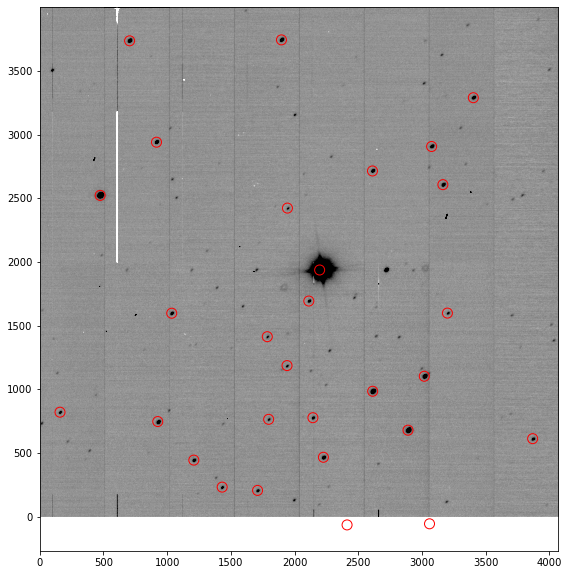

In [220]:
import matplotlib.lines as mlines
data = exposure.getImage().getArray()
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(data)
fig,ax = plt.subplots(figsize=(10,10))
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')

x,y = updatedWcs.skyToPixelArray(ra,dec)

select = (mag_array<17) & (mag_array>1)
ax.scatter(x[select],y[select],s=100,facecolors='none', edgecolors='red',)
#ax.set_title(f'Offset angle {angle} degrees, \n x,y shift ({xshift},{yshift}) px', fontsize=18)

ok, looks good! 

Next need to implement these steps into the AuxTel pipeline for donuts:
* take the gaia reference catalog
* take the in-focus exposure
* run source detection task - gives source catalpg 
* run astrometry matching task using the reference catalog - updates the exposure WCS
* given the new WCS, pass the defocal exposures to `estimateZernikesLatiss` task 

The defocal images are `487`, `488` : 

In [189]:
#from lsst.daf import butler as dafButler
postIsr = butler.get('postISRCCD', dataId={'instrument':'LATISS', 'detector':0, 
                                     'exposure':int(f'2021090800488')
                                        },
                      collections=['u/scichris/Latiss/postISRtest'])


#from lsst.daf import butler as dafButler
#butler = dafButler.Butler('/repo/main/', instrument='LATISS')
exposure_intra = butler.get('postISRCCD', dataId={'instrument':'LATISS', 'detector':0, 
                                     'exposure':2021090800487},
                      collections=['u/scichris/Latiss/postISRtest'])


exposure_extra = butler.get('postISRCCD', dataId={'instrument':'LATISS', 'detector':0, 
                                     'exposure':2021090800488},
                      collections=['u/scichris/Latiss/postISRtest'])

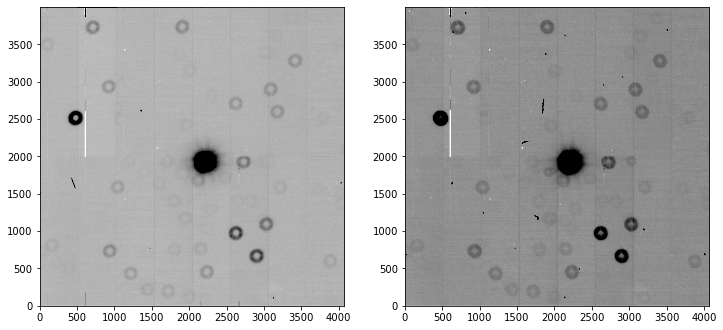

In [192]:
%matplotlib inline
import matplotlib.pyplot as plt
zscale = ZScaleInterval()


fig,ax  = plt.subplots(1,2,figsize=(12, 10))

# plot extra-focal
data = exposure_intra.getImage().getArray()
vmin, vmax = zscale.get_limits(data)
ax[0].imshow(data, origin='lower',vmin=vmin,vmax=vmax, cmap='Greys')

# plot intra-focal
data = exposure_extra.getImage().getArray()
vmin, vmax = zscale.get_limits(data)
ax[1].imshow(data, origin='lower',vmin=vmin,vmax=vmax, cmap='Greys')


Update the WCS info in intra and extra-focal images:

In [203]:
exposure_intra.setWcs(exposure.getWcs())
exposure_extra.setWcs(exposure.getWcs())

# declare the defocal exposure pair 
exp_pair = [exposure_intra, exposure_extra]

In [1]:
from lsst.ts.wep.task.GenerateDonutCatalogWcsTask import (GenerateDonutCatalogWcsTask, 
                                                             GenerateDonutCatalogWcsTaskConfig)

In [193]:
from lsst.ts.wep.task.GenerateDonutCatalogOnlineTask import (GenerateDonutCatalogOnlineTask, 
                                                             GenerateDonutCatalogOnlineTaskConfig)

Get the boresight and pointing information. Each exposure has slightly different values:

In [194]:
visitInfo = exposure_intra.getInfo().getVisitInfo()
print(f"Boresight Ra, Dec is: {visitInfo.getBoresightRaDec()}, Boresight Rotation Angle in degrees is: {visitInfo.getBoresightRotAngle().asDegrees()}")

Boresight Ra, Dec is: (307.0740569738, -87.4725996738), Boresight Rotation Angle in degrees is: 207.277469361424


In [195]:
visitInfo = exposure_extra.getInfo().getVisitInfo()
print(f"Boresight Ra, Dec is: {visitInfo.getBoresightRaDec()}, Boresight Rotation Angle in degrees is: {visitInfo.getBoresightRotAngle().asDegrees()}")

Boresight Ra, Dec is: (307.0776930450, -87.4724712837), Boresight Rotation Angle in degrees is: 207.392323594973


In [196]:
visitInfo = exposure.getInfo().getVisitInfo()
print(f"Boresight Ra, Dec is: {visitInfo.getBoresightRaDec()}, Boresight Rotation Angle in degrees is: {visitInfo.getBoresightRotAngle().asDegrees()}")

Boresight Ra, Dec is: (307.0794913975, -87.4725165002), Boresight Rotation Angle in degrees is: 207.835275335279


Pass that information to `ts_wep`:

In [197]:
from lsst.ts.wep.task.GenerateDonutCatalogWcsTask import (GenerateDonutCatalogWcsTask, 
                                                             GenerateDonutCatalogWcsTaskConfig)

donutCatConfig = GenerateDonutCatalogOnlineTaskConfig()
donutCatConfig.boresightRa = visitInfo.getBoresightRaDec().getRa().asDegrees()
donutCatConfig.boresightDec = visitInfo.getBoresightRaDec().getDec().asDegrees()
donutCatConfig.boresightRotAng = visitInfo.getBoresightRotAngle().asDegrees()
donutCatConfig.filterName = 'phot_g_mean'

# instantiate the task with the appropriate config 
donutCatTask = GenerateDonutCatalogOnlineTask(config=donutCatConfig)


camera = "LATISS"
refObjLoader = donutCatTask.getRefObjLoader(deferredList)
refObjLoader.config.filterMap = {"g": "phot_g_mean" }


donutCatStruct = donutCatTask.run(camera, deferredList)

In [198]:
# instantiate the task with the appropriate config 
donutCatTask = GenerateDonutCatalogOnlineTask(config=donutCatConfig)

In [ ]:
donut

I already have a deferred list of reference catalogs available from before:

In [199]:
deferredList[:3]

[DeferredDatasetHandle(butler=<lsst.daf.butler._butler.Butler object at 0x7f5d8f5349d0>, ref=DatasetRef(DatasetType('gaia_dr2_20200414', {htm7}, SimpleCatalog), {htm7: 133534}, id=99a306dd-5323-4861-b90b-d0be778afe5b, run='refcats/DM-28636'), parameters=None),
 DeferredDatasetHandle(butler=<lsst.daf.butler._butler.Butler object at 0x7f5d8f5349d0>, ref=DatasetRef(DatasetType('gaia_dr2_20200414', {htm7}, SimpleCatalog), {htm7: 148960}, id=6a3e44df-05d5-4db4-8ee3-390a10c086bc, run='refcats/DM-28636'), parameters=None),
 DeferredDatasetHandle(butler=<lsst.daf.butler._butler.Butler object at 0x7f5d8f5349d0>, ref=DatasetRef(DatasetType('gaia_dr2_20200414', {htm7}, SimpleCatalog), {htm7: 163940}, id=4f1f503e-b30e-42d8-9116-e599621320ba, run='refcats/DM-28636'), parameters=None)]

In [200]:
camera = "LATISS"
refObjLoader = donutCatTask.getRefObjLoader(deferredList)
refObjLoader.config.filterMap = {"g": "phot_g_mean" }


donutCatStruct = donutCatTask.run(camera, deferredList)

root INFO: Loading reference objects from region bounded by [305.30882692, 308.76669630], [-87.54747938, -87.39571430] RA Dec
root INFO: Loaded 178 reference objects


Get the donut catalog:

In [201]:
donutCatalog = donutCatStruct.donutCatalog

In [221]:
donutCatalog.columns

Index(['coord_ra', 'coord_dec', 'centroid_x', 'centroid_y', 'source_flux',
       'detector', 'mags'],
      dtype='object')

Impart a magnitude cut on a donut catalog:

In [208]:
import astropy.units as u
mag_list = (donutCatalog['source_flux'].values * u.nJy).to(u.ABmag)
mag_array = np.array(mag_list)

donutCatalog['mags'] = mag_array
mask = mag_array<16
donutCatalogMagCut = donutCatalog[mask]
donutCatalogMagCut

,coord_ra,coord_dec,centroid_x,centroid_y,source_flux,detector,mags
9,5.364554,-1.527185,3008.818035,2742.490639,4.271779e+06,RXX_S00,14.823478
24,5.361596,-1.527345,2923.169672,3177.029181,7.442741e+06,RXX_S00,14.220668
32,5.344077,-1.527146,1272.038978,3577.001179,1.524703e+06,RXX_S00,15.942037
41,5.354168,-1.527319,2282.862667,3454.506281,2.095336e+06,RXX_S00,15.596866
58,5.342578,-1.526965,960.468603,3303.015487,2.337109e+06,RXX_S00,15.478303
59,5.360085,-1.527165,2617.003552,2899.687930,7.411704e+06,RXX_S00,14.225205
93,5.376802,-1.526306,3177.225493,526.650212,2.068339e+06,RXX_S00,15.610946
117,5.345528,-1.526124,336.389946,1578.758443,1.886252e+07,RXX_S00,13.211001
137,5.359813,-1.526682,2109.092970,1992.062824,2.216511e+09,RXX_S00,8.035825
138,5.352598,-1.525647,447.775973,347.810399,3.320883e+06,RXX_S00,15.096866


In [238]:
type(donutCatalogMagCut)

pandas.core.frame.DataFrame

But... since we've already done source fitting on the in-focus image and therefore we know the location of sources,
why not pass that as a donut catalog to `estimateZernikeTask.run` ? 

Running the Zernike estimation:

In [202]:
from lsst.ts.wep.task.EstimateZernikesLatissTask import EstimateZernikesLatissTask, EstimateZernikesLatissTaskConfig
estimateZernikeConfig = EstimateZernikesLatissTaskConfig(donutStampSize=200,donutTemplateSize=200)
estimateZernikeTask = EstimateZernikesLatissTask(config=estimateZernikeConfig)
estimateZernikeTask.instName = 'auxTel'
estimateZernikeTask.opticalModel = 'onAxis'

In [209]:
# This will take around a minute on medium instance on RSP
zernikeOutput = estimateZernikeTask.run(exp_pair, donutCatalogMagCut,"LATISS")

In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=2.0

 rMask:
0.0026388888888888885
3008 2742
--> 3055 2789
2923 3177
--> 2970 3223
1272 3577
--> 1245 3609
2282 3454
--> 2327 3406
960 3303
--> 1006 3254
2617 2899
--> 2615 2849
3177 526
--> 3128 481
336 1578
--> 385 1626
2109 1992
--> 2202 1933
447 347
--> 466 389
735 1119
--> 779 1166
2445 1176
--> 2492 1127
2888 939
--> 2936 987
3006 1229
--> 2988 1180
1633 223
--> 1681 199
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=2.0

 rMask:
0.0026388888888888885
3008 2742
--> 3056 2789
2923 3177
--> 2970 3224
1272 3577
--> 1276 3608
2282 3454
--> 2329 3419
960 3303
--> 1006 3347
2617 2899
--> 2600 2849
3177 526
--> 3127 561
336 1578
--> 383 1584
2109 1992
--> 2199 1933
447 347
--> 447 393
735 1119
--> 734 1070
2445 1176
--> 2491 113

itr = 11, z4-z22
[-5.  4.  1.  6. -3.  8. -9.  1. -1.  0. -5. -3. -0. -1.  0. -1. -5.  1.
 -0.]
itr = 12, z4-z22
[ -5.   4.  -0.   6.  -3.   7. -10.   1.  -1.   0.  -6.  -3.  -0.  -1.
   0.  -1.  -6.   2.  -0.]
itr = 13, z4-z22
[ -6.   5.  -1.   6.  -3.   6. -10.   1.  -1.   0.  -8.  -4.  -0.  -1.
   0.  -1.  -8.   2.  -0.]
itr = 14, z4-z22
[ -6.   5.  -2.   5.  -3.   5. -11.   1.  -1.   0.  -9.  -5.  -0.  -1.
   0.  -1.  -9.   3.  -0.]
4 / 15
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=1

 rMask:
0.0013194444444444443
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=1

 rMask:
0.0013194444444444443
imageCoCenter: (x, y) = (   99.50,   99.50)

imageCoCenter: (x, y) = (   99.51,  101.26)

itr = 0, z4-z22
[ 1. -3.  2. 44.  1. -5.  2. -0. -1.  0. -0. -1. -0. -9. -0.  2.  1. -1.
  0.]
itr = 1, z4-z22
[ 1. -3.  2. 45.  1. -5.  2. -0. -1.  0. -0. -1. -0. -9. -0.  2.  1. -1.
  0.]
itr = 2, z4-z22
[ 2. -1.  2. 45.  0. -5. -0. -0. -1.  

itr = 12, z4-z22
[-111.   70.  -56.   -6.  -30.  -59.   58.   17.  -25.   17.   32.  -52.
    3.    3.   -9.    5.   21.  -23.   -2.]
itr = 13, z4-z22
[-116.   92.  -93.   -7.  -20.  -54.   43.   18.  -26.   19.   36.  -61.
    1.    4.   -8.    4.   24.  -26.   -2.]
itr = 14, z4-z22
[-118.  118. -132.   -0.  -19.  -56.   28.   18.  -25.   19.   39.  -71.
    1.    2.   -6.    5.   25.  -30.   -2.]
8 / 15
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=1

 rMask:
0.0013194444444444443
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=1

 rMask:
0.0013194444444444443
imageCoCenter: (x, y) = (   93.35,  110.22)

imageCoCenter: (x, y) = (   96.83,  107.38)

itr = 0, z4-z22
[  0.  67. -90.  16.  33. -21.  -8. -17.  16.  -1.  -4.  -7.  -6.  -2.
  -1.   0.   3.   3.   6.]
itr = 1, z4-z22
[  1.  63. -87.  18.  32. -19.  -6. -17.  16.  -0.  -5.  -7.  -5.  -3.
  -1.   0.   3.   3.   6.]
itr = 2, z4-z22
[ -0.  65. -88.  20.  34. -22.  -7. -17

itr = 12, z4-z22
[  15.  -56.   10.   31.  -11. -119.  -54.   -2.   -2.    3.   -5.    2.
   -0.   -3.    2.    6.  -22.    2.   -0.]
itr = 13, z4-z22
[  14.  -58.    8.   32.  -11. -124.  -57.   -2.   -2.    3.   -6.    2.
   -0.   -3.    2.    6.  -26.    2.   -0.]
itr = 14, z4-z22
[  14.  -64.    6.   33.  -13. -130.  -61.   -2.   -2.    3.   -8.    2.
    0.   -3.    2.    6.  -31.    3.   -0.]
12 / 15
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=1

 rMask:
0.0013194444444444443
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=1

 rMask:
0.0013194444444444443
imageCoCenter: (x, y) = (  109.03,  108.88)

imageCoCenter: (x, y) = (  114.75,  112.52)

itr = 0, z4-z22
[ -3. -11.  28. 225. 286.   0.  -8.  -1.  -6.   2.  -1.  -1. -58. -46.
   2.  -1. -10.   1.   1.]
itr = 1, z4-z22
[ -4. -10.  24. 224. 288.   1.  -8.  -1.  -6.   1.  -0.  -1. -59. -46.
   3.  -2.  -9.   3.   1.]
itr = 2, z4-z22
[ -5.  -8.  24. 226. 285.   1.  -7.  -

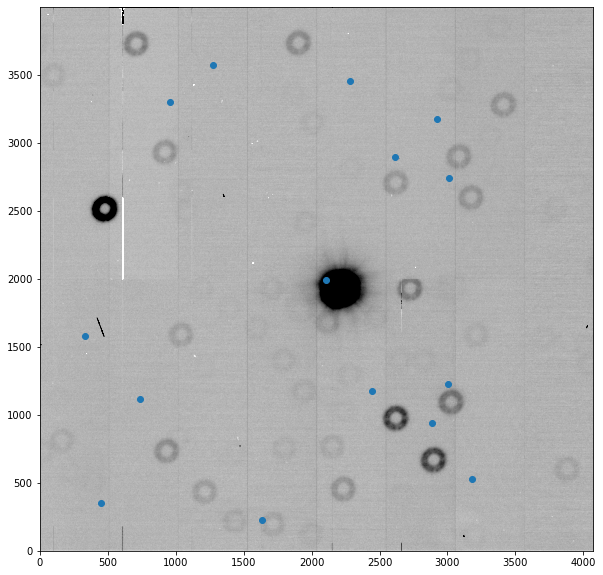

In [215]:
from astropy.visualization import ZScaleInterval
data = exposure_intra.image.array
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(data)

fig,ax = plt.subplots(1,1,figsize=(10,10))
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')
ax.scatter(donutCatalogMagCut['centroid_x'], donutCatalogMagCut['centroid_y'])


Text(0.5, 1.0, 'Intra')

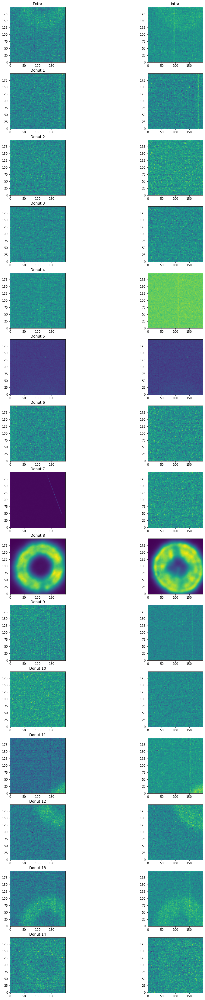

In [216]:
nrows = len(zernikeOutput.donutStampsExtra)
fig,ax = plt.subplots(nrows,2,figsize=(nrows,4*nrows))

for i in range(nrows):
    donut = zernikeOutput.donutStampsExtra[i]
    ax[i,0].imshow(donut.stamp_im.getArrays()[0], origin='lower')
    
    donut = zernikeOutput.donutStampsIntra[i]
    ax[i,1].imshow(donut.stamp_im.getArrays()[0], origin='lower')
    ax[i,0].set_title(f'Donut {i}')
ax[0,0].set_title('Extra')
ax[0,1].set_title('Intra')

Instead of doing that (passing the source catalog which is solely based on the provided ra,dec, boresight), which gives totally wrong results. Just need to make sure that the columns have the same names as what is expected from donutCatalog:

`'coord_ra', 'coord_dec', 'centroid_x', 'centroid_y', 'source_flux',
       'detector', 'mags'`
       


In [228]:
base = catalog['base_PsfFlux_instFlux']
slot = catalog['slot_PsfFlux_instFlux']

In [229]:
base-slot

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0.])

In [ ]:
ok, so the two measurements are the same in this case. 

In [239]:
type(catalog)

lsst.afw.table.SourceCatalog

Need to change lsst.afw.table.SourceCatalog to pandas.pandas.core.frame.DataFrame

And to change names: 


    coord_ra : ok  
    coord_dec : ok
    centroid_x : base_Centroid_x  
    centroid_y : base_Centroid_y
    source_flux : base_PsfFlux_instFlux
    detector: make new 

In [ ]:
donutCatalogFromAstrometry = catalog.table

In [243]:
table= catalog.asAstropy()

In [246]:
df = table.to_pandas()

In [250]:
df.columns

Index(['id', 'coord_ra', 'coord_dec', 'parent', 'base_NaiveCentroid_x',
       'base_NaiveCentroid_y', 'base_NaiveCentroid_flag',
       'base_NaiveCentroid_flag_noCounts', 'base_NaiveCentroid_flag_edge',
       'base_NaiveCentroid_flag_resetToPeak',
       ...
       'slot_PsfFlux_npixels', 'base_PsfFlux_flag', 'slot_PsfFlux_flag',
       'base_PsfFlux_flag_noGoodPixels', 'slot_PsfFlux_flag_noGoodPixels',
       'base_PsfFlux_flag_edge', 'slot_PsfFlux_flag_edge',
       'base_Variance_flag', 'base_Variance_value',
       'base_Variance_flag_emptyFootprint'],
      dtype='object', length=253)

In [298]:
donutCatalogFromAstrometry = df[['coord_ra', 'coord_dec', 'base_NaiveCentroid_x',
                                'base_NaiveCentroid_y', 'base_PsfFlux_instFlux',]].copy()

donutCatalogFromAstrometry['detector'] = 'RXX_S00'
donutCatalogFromAstrometry = donutCatalogFromAstrometry.rename(columns={"base_NaiveCentroid_x":"centroid_x", 
                                    "base_NaiveCentroid_y":"centroid_y",
                                    "base_PsfFlux_instFlux":"source_flux"})

flux = donutCatalogFromAstrometry['source_flux']

import astropy.units as u
mag_list = (donutCatalogFromAstrometry['source_flux'].values * u.nJy).to(u.ABmag)
mag_array = np.array(mag_list)

donutCatalogFromAstrometry['mags'] = mag_array
mask = mag_array<16
donutCatalogFromAstrometryCut = donutCatalogFromAstrometry[mask]


donutDf = donutCatalogFromAstrometry.copy()

/software/lsstsw/stack_20210813/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe/lib/python3.8/site-packages/astropy/units/function/logarithmic.py:46: RuntimeWarning: invalid value encountered in log10
  return dex.to(self._function_unit, np.log10(x))


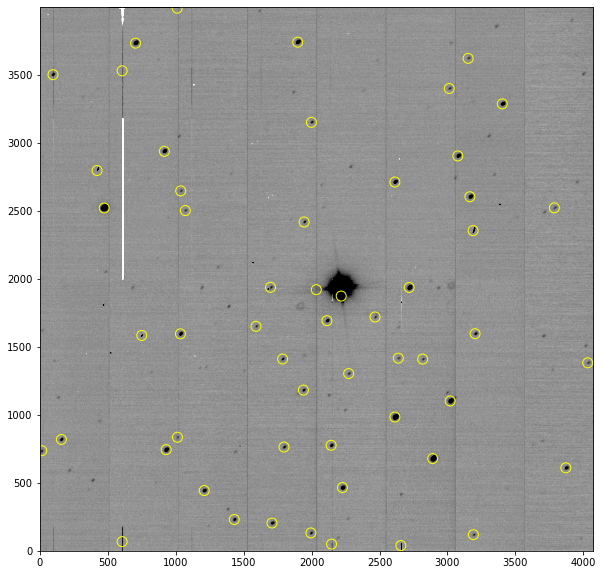

In [300]:
data = exposure.image.array
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(data)

fig,ax = plt.subplots(1,1,figsize=(10,10))
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')
ax.scatter(donutDf['centroid_x'], donutDf['centroid_y'], s=100, label='template fitting',
           facecolors='none', edgecolors='yellow')


Now, the `coord_ra` and `coord_dec` are correct, as they come from astrometry matching ... 

In [283]:
border =  200
exposure.getDimensions()

Extent2I(4072, 4000)

In [301]:
bbox = exposure.getBBox()
xmax = bbox.getEndX()
ymax = bbox.getEndY()

m1 = (0+border) < donutDf['centroid_x']
m2 = (0+border) < donutDf['centroid_y']
m3 = donutDf['centroid_x'] < (xmax-border)
m4 = donutDf['centroid_y'] < (ymax-border)
m = m1*m2*m3*m4

/software/lsstsw/stack_20210813/conda/miniconda3-py38_4.9.2/envs/lsst-scipipe/lib/python3.8/site-packages/pandas/core/computation/expressions.py:204: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  warnings.warn(


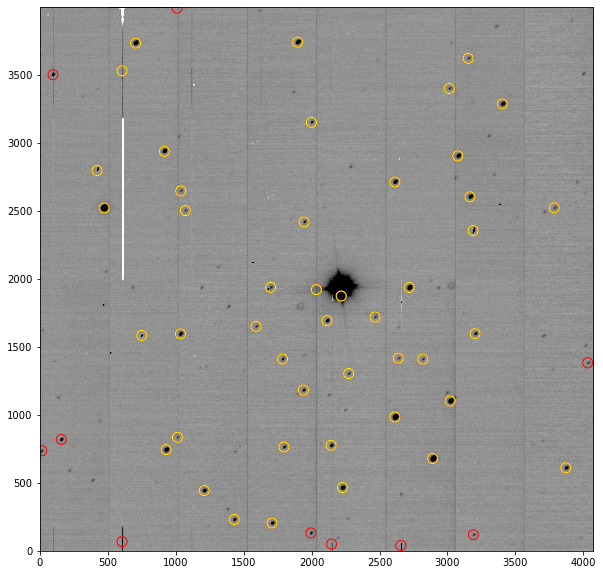

In [302]:
data = exposure.image.array
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(data)

fig,ax = plt.subplots(1,1,figsize=(10,10))
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')
ax.scatter(donutDf['centroid_x'], donutDf['centroid_y'], s=100, label='template fitting',
           facecolors='none', edgecolors='red')
ax.scatter(donutDf['centroid_x'][m], donutDf['centroid_y'][m], s=100, label='template fitting',
           facecolors='none', edgecolors='yellow')


In [303]:
donutDfClean = donutDf[m].copy()

In [312]:
donutDfCleanBright = donutDfClean[donutDfClean['mags'] < 22]

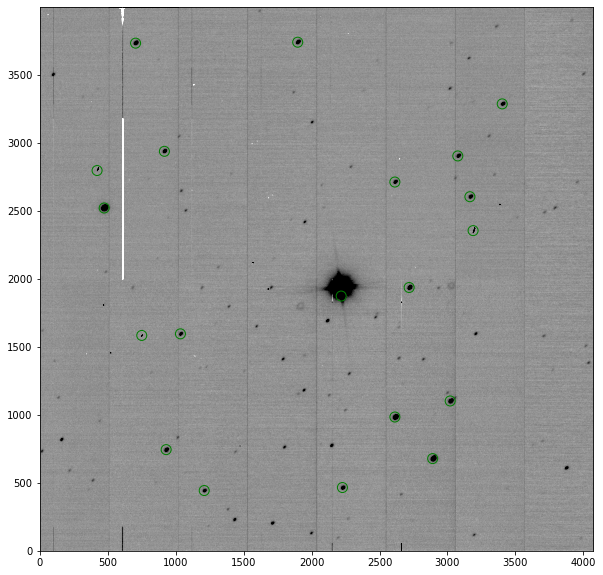

In [313]:
fig,ax = plt.subplots(1,1,figsize=(10,10))
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')
ax.scatter(donutDfCleanBright['centroid_x'], donutDfCleanBright['centroid_y'], s=100, label='template fitting',
           facecolors='none', edgecolors='green')

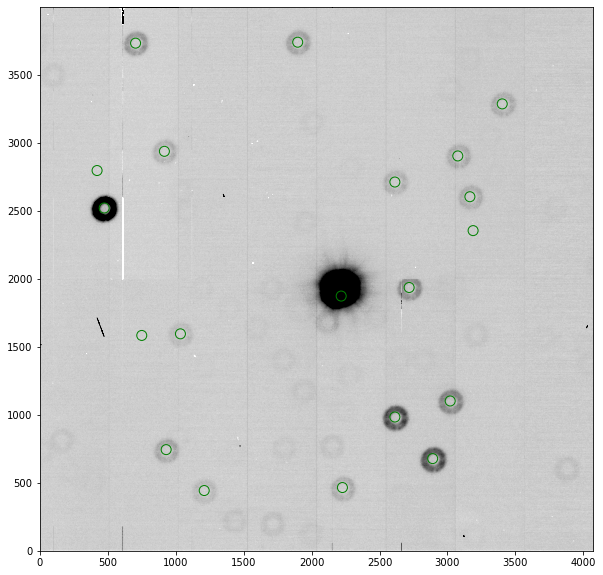

In [322]:
fig,ax = plt.subplots(1,1,figsize=(10,10))
data = exposure_intra.image.array
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')
ax.scatter(donutDfCleanBright['centroid_x'], donutDfCleanBright['centroid_y'], s=100, label='template fitting',
           facecolors='none', edgecolors='green')

In [314]:
zernikeOutput2 = estimateZernikeTask.run(exp_pair, donutDfCleanBright, "LATISS")

In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=2.0

 rMask:
0.0026388888888888885
1210 443
--> 1209 435
2227 464
--> 2228 455
2891 678
--> 2892 669
930 744
--> 929 735
2613 984
--> 2614 976
3019 1101
--> 3021 1094
750 1584
--> 743 1537
1035 1596
--> 1037 1588
2217 1874
--> 2210 1927
2717 1937
--> 2718 1926
3188 2355
--> 3233 2338
474 2522
--> 474 2515
3165 2604
--> 3167 2597
2612 2713
--> 2613 2708
421 2797
--> 430 2748
3075 2904
--> 3079 2901
917 2938
--> 918 2932
3403 3288
--> 3405 3283
704 3735
--> 706 3730
1897 3741
--> 1899 3735
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=2.0

 rMask:
0.0026388888888888885
1210 443
--> 1208 434
2227 464
--> 2228 455
2891 678
--> 2891 667
930 744
--> 931 733
2613 984
--> 2613 974
3019 1101
--> 3019 1093
750 1584
--> 705 1629
1035 159

itr = 6, z4-z22
[-18.  27.  -9.   8.  16. -11.  -5.  -6.   2.  -1.  -1.  -1.  -2.  -1.
   1.   1.   0.  -0.   2.]
itr = 7, z4-z22
[-26.  30.  -4.   2.   8. -13.  -6.  -7.   2.  -1.  -1.  -1.   1.   1.
   1.   1.   1.  -0.   2.]
itr = 8, z4-z22
[-35.  31.  -0.   9.  14. -16.  -8.  -7.   2.  -0.  -1.  -1.  -2.  -1.
   1.   1.   0.  -1.   2.]
itr = 9, z4-z22
[-33.  34.   4.   8.  15. -15.  -7.  -8.   2.  -0.  -2.  -2.  -2.  -1.
   1.   1.   1.  -1.   2.]
itr = 10, z4-z22
[-30.  38.   8.   5.  14. -15.  -7.  -8.   2.  -1.  -2.  -2.  -1.   0.
   1.   1.   1.  -1.   3.]
itr = 11, z4-z22
[-29.  39.  11.   7.  15. -16.  -6.  -9.   2.  -0.  -3.  -3.  -2.  -1.
   1.   1.   1.  -1.   3.]
itr = 12, z4-z22
[-26.  43.  16.   4.  14. -15.  -5.  -9.   2.  -1.  -3.  -3.  -1.   0.
   1.   1.   2.  -2.   3.]
itr = 13, z4-z22
[-24.  45.  19.   4.  13. -16.  -5.  -9.   2.  -1.  -3.  -4.  -1.   1.
   1.   1.   2.  -2.   3.]
itr = 14, z4-z22
[-23.  46.  22.   6.  14. -16.  -4. -10.   2.  -0.  -4.  -4.  -1.  

itr = 10, z4-z22
[-19.  24. -11.  -2.  -2.  -9. -15.  -4.   2.   1.  -4.   4.   1.   0.
   1.   0.   1.   2.   1.]
itr = 11, z4-z22
[-18.  28. -10.  -2.  -2. -10. -15.  -4.   2.   1.  -5.   5.   1.   0.
   1.   0.   1.   3.   1.]
itr = 12, z4-z22
[-18.  30.  -8.  -1.  -2. -11. -16.  -4.   2.   1.  -6.   6.   1.   0.
   1.   0.   1.   4.   1.]
itr = 13, z4-z22
[-17.  33.  -7.  -1.  -2. -12. -16.  -4.   2.   1.  -7.   7.   1.   0.
   1.   0.   1.   4.   1.]
itr = 14, z4-z22
[-16.  36.  -6.  -1.  -2. -13. -16.  -4.   2.   1.  -8.   8.   1.   0.
   1.  -0.   2.   5.   1.]
8 / 20
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=1

 rMask:
0.0013194444444444443
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=1

 rMask:
0.0013194444444444443
imageCoCenter: (x, y) = (  101.33,  101.48)

imageCoCenter: (x, y) = (  102.83,   99.37)

itr = 0, z4-z22
[ -1.  64. -85.  22.  35. -20.  -7. -17.  16.  -0.  -6.  -7.  -7.  -5.
  -1.   1.   3.   2.   

itr = 10, z4-z22
[-73. 145. -19.  -6.   3. -38. -29. -28.   8.   1. -10.  -7.   1.   2.
   1.   0.   5.   0.   7.]
itr = 11, z4-z22
[-68. 151. -14.  -3.   6. -40. -29. -29.   8.   1. -12.  -8.  -0.   0.
   1.   1.   6.   0.   7.]
itr = 12, z4-z22
[-62. 157. -10.  -2.   4. -41. -30. -29.   8.   1. -13.  -9.   1.   0.
   1.   0.   7.   0.   7.]
itr = 13, z4-z22
[-57. 162.  -7.  -2.   3. -42. -31. -30.   8.   1. -14. -10.   2.   1.
   1.   0.   8.  -0.   8.]
itr = 14, z4-z22
[-53. 166.  -4.  -3.   5. -43. -31. -30.   8.   1. -15. -11.   0.   1.
   0.   0.   8.   0.   8.]
12 / 20
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=1

 rMask:
0.0013194444444444443
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=1

 rMask:
0.0013194444444444443
imageCoCenter: (x, y) = (  100.04,   99.46)

imageCoCenter: (x, y) = (  100.33,   99.40)

itr = 0, z4-z22
[  6.  12. -10.   2.   5.   2.  -0.  -3.   1.  -0.  -2.  -2.  -0.  -0.
  -0.  -1.   0.  -0.  

itr = 11, z4-z22
[ -2.  64. -23.   6.  -1.  10.  -1.  -7.   2.  -1.  -4.  -1.   0.  -1.
  -0.  -2.   3.   5.   1.]
itr = 12, z4-z22
[ -1.  68. -22.   6.  -0.   7.  -1.  -7.   2.  -0.  -5.  -1.  -0.  -1.
  -0.  -2.   3.   6.   2.]
itr = 13, z4-z22
[ -0.  72. -21.   6.  -0.   4.  -1.  -7.   2.  -0.  -6.  -2.  -0.  -1.
  -0.  -2.   4.   7.   2.]
itr = 14, z4-z22
[  0.  76. -20.   6.  -0.   1.  -2.  -7.   2.  -0.  -7.  -2.  -0.  -1.
  -0.  -2.   4.   9.   2.]
16 / 20
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=1

 rMask:
0.0013194444444444443
apertureDiameter=1.2, focalLength=21.6
offset=0.0475
maskScalingFactorLocal=1

 rMask:
0.0013194444444444443
imageCoCenter: (x, y) = (   99.50,   99.50)

imageCoCenter: (x, y) = (   99.50,   99.50)

itr = 0, z4-z22
[ -3.  17. -16.  20.   4. -10.  -6.  -3.   3.  -1.   0.  -1.  -0.  -4.
   1.   2.   1.   0.   1.]
itr = 1, z4-z22
[ -4.  16. -15.  19.   4.  -9.  -6.  -3.   3.  -1.   0.  -1.  -0.  -4.
   1.   2.   1.   0.   

itr = 12, z4-z22
[ -5. 109. -26.  -0.   8. -14.   2. -10.   2.  -1.  -4.  -0.  -1.  -0.
  -1.   0.   2.   5.   3.]
itr = 13, z4-z22
[ -3. 115. -26.   0.   8. -14.   1. -11.   2.  -1.  -4.  -0.  -1.  -0.
  -1.   0.   3.   6.   3.]
itr = 14, z4-z22
[ -2. 121. -26.   1.   8. -15.  -0. -11.   2.  -1.  -5.  -0.  -2.  -1.
  -1.   0.   3.   7.   3.]


Now plot the donut stamps again: 

Text(0.5, 1.0, 'Intra')

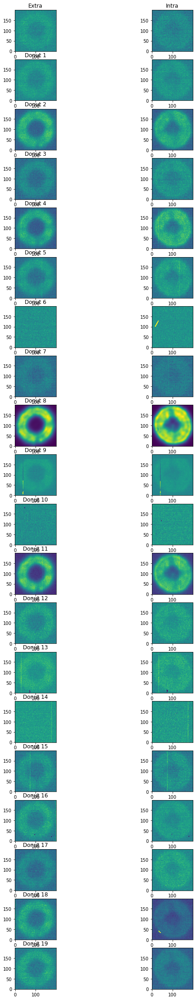

In [320]:
%matplotlib inline
nrows = len(zernikeOutput2.donutStampsExtra)
fig,ax = plt.subplots(nrows,2,figsize=(10,2*nrows))

for i in range(nrows):
    donut = zernikeOutput2.donutStampsExtra[i]
    data = donut.stamp_im.getArrays()[0]
    vmin, vmax = zscale.get_limits(data)

    ax[i,0].imshow(data, vmin=vmin,vmax=vmax, origin='lower')
    
    donut = zernikeOutput2.donutStampsIntra[i]
    data = donut.stamp_im.getArrays()[0]
    vmin, vmax = zscale.get_limits(data)
    ax[i,1].imshow(donut.stamp_im.getArrays()[0], vmin=vmin,vmax=vmax,  origin='lower')
    ax[i,0].set_title(f'Donut {i}')
ax[0,0].set_title('Extra')
ax[0,1].set_title('Intra')

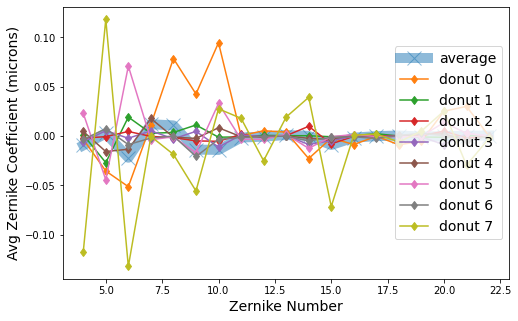

In [321]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(figsize=(8, 5))
# I'm not sure about the OPD values to compare to... 
#plt.plot(np.arange(4, 23), opdVals[85], '-o', lw=3, markersize=10, label='OPD')
plt.plot(np.arange(4, 23),  zernikeOutput.outputZernikesAvg, '-x', lw=10,alpha=0.5, markersize=14, label='average')
for i in [0,1,2,3,4,5,6,7]:
    plt.plot(np.arange(4, 23),zernikeOutput.outputZernikesRaw[i], '-d', label=f'donut {i}')
    plt.xlabel('Zernike Number', size=14)
    plt.ylabel('Avg Zernike Coefficient (microns)', size=14)
plt.legend(fontsize=14, loc='center right')

**Next**: 
- add that code to EstimateZernikesTask (or before... ? ) - it's to get  the source catalog that's passed on to `estimateZernikesTask.run`

## Use the new refCat interface that uses the exposure WCS to get the catalog:

In [25]:
from lsst.daf import butler as dafButler
from lsst.daf import butler as dafButler
butler = dafButler.Butler('/repo/main/', instrument='LATISS')


exposure_intra = butler.get('postISRCCD', dataId={'instrument':'LATISS', 'detector':0, 
                                     'exposure':2021090800487},
                      collections=['u/scichris/Latiss/postISRtest'])


exposure_extra = butler.get('postISRCCD', dataId={'instrument':'LATISS', 'detector':0, 
                                     'exposure':2021090800488},
                      collections=['u/scichris/Latiss/postISRtest'])

postIsr = butler.get('postISRCCD', dataId={'instrument':'LATISS', 'detector':0, 
                                     'exposure':2021090800489
                                        },
                      collections=['u/scichris/Latiss/postISRtest'])

Use the in-focus visit info:

In [26]:

visitInfo = postIsr.getInfo().getVisitInfo()

boresightRa = visitInfo.getBoresightRaDec().getRa().asDegrees()
boresightDec = visitInfo.getBoresightRaDec().getDec().asDegrees()
boresightRotAng = visitInfo.getBoresightRotAngle().asDegrees()

In [27]:
from lsst.ts.wep.task.RefCatalogInterface import RefCatalogInterface

refCatInterface = RefCatalogInterface(boresightRa, boresightDec,boresightRotAng)

In [28]:
shardIds = refCatInterface.getShardIds()

In [29]:
shardIds

array([184325, 184328, 184329, 184330, 184331, 184332, 184333, 184335,
       184357, 184360, 184362, 184363, 184364, 184368, 184369, 184370,
       184371, 184372, 184373, 184374, 184375, 184378, 184380, 184381,
       184382, 184383, 167937, 167940, 167942, 167943, 167950, 167960,
       167992, 184321, 184322, 184323, 184324, 184326, 184327, 184334,
       184340, 184341, 184343, 184346, 184348, 184356, 184358, 184359,
       184361, 184365, 184366, 184367, 184376, 184377, 184379, 184532,
       184534, 184535, 184552, 184560])

In [30]:
from lsst.daf import butler as dafButler
butler = dafButler.Butler('/repo/main/', instrument='LATISS')
catalogName = 'gaia_dr2_20200414'
collections = 'refcats'

dataRefs, dataIds = refCatInterface.getDataRefs(shardIds, butler, catalogName, collections)


In [31]:
from lsst.ts.wep.task.GenerateDonutCatalogWcsTask import (GenerateDonutCatalogWcsTask, 
                                                             GenerateDonutCatalogWcsTaskConfig)

donutCatConfig = GenerateDonutCatalogWcsTaskConfig()
donutCatConfig.filterName= 'phot_g_mean'

# instantiate the task with the appropriate config 
donutCatTask = GenerateDonutCatalogWcsTask(config=donutCatConfig)



In [32]:
refObjLoader = donutCatTask.getRefObjLoader(dataRefs)
refObjLoader.config.filterMap = {"g": "phot_g_mean" }

Rotate the WCS on the postISR image by 180 deg 

In [43]:
import lsst.geom
from lsst.afw.geom import makeSkyWcs,  makeCdMatrix


wcs = postIsr.getWcs()
rotationInDeg = 180 

info = postIsr.getInfo().getVisitInfo()
orientation = (info.getBoresightRotAngle().asDegrees()+\
               rotationInDeg)* lsst.geom.degrees#  info.getBoresightRotAngle()# 0 * lsst.geom.degrees  # 
flipX = True
scale =  wcs.getPixelScale() # 0.2 * lsst.geom.arcseconds  # how many arcsec per pixel 
cdMatrix = makeCdMatrix(scale=scale, orientation=orientation, flipX=flipX)

pxOrigin = wcs.getPixelOrigin()

crpix = pxOrigin
crval = wcs.getSkyOrigin() # lsst.geom.SpherePoint(0.0*lsst.geom.degrees, 0.0*lsst.geom.degrees)
newWcs = makeSkyWcs(crpix=crpix, crval=crval, cdMatrix=cdMatrix)

postIsr.setWcs(newWcs)

In [44]:
#camera = "LATISS"
donutCatStruct = donutCatTask.run(dataRefs, postIsr, )

root INFO: Loading reference objects from region bounded by [305.30492316, 308.76327582], [-87.54778646, -87.39601829] RA Dec
root INFO: Loaded 178 reference objects


Plot these sources on top of the postisr exposure to make sure the correct WCS was used:

In [45]:
donutCatalog = donutCatStruct.donutCatalog

In [46]:
import astropy.units as u
mag_list = (donutCatalog['source_flux'].values * u.nJy).to(u.ABmag)
mag_array = np.array(mag_list)

donutCatalog['mags'] = mag_array
mask = mag_array<16
donutCatalogMagCut = donutCatalog[mask]
donutCatalogMagCut

,coord_ra,coord_dec,centroid_x,centroid_y,source_flux,detector,mags
0,5.359813,-1.526682,2109.092970,2019.937176,2.216511e+09,RXX_S00,8.035825
1,5.345528,-1.526124,336.389945,2433.241557,1.886252e+07,RXX_S00,13.211001
2,5.361596,-1.527345,2923.169673,834.970819,7.442741e+06,RXX_S00,14.220668
3,5.360085,-1.527165,2617.003552,1112.312070,7.411704e+06,RXX_S00,14.225205
4,5.364554,-1.527185,3008.818036,1269.509361,4.271779e+06,RXX_S00,14.823478
5,5.352598,-1.525647,447.775972,3664.189602,3.320883e+06,RXX_S00,15.096866
6,5.363996,-1.525853,1633.611511,3788.976730,2.642679e+06,RXX_S00,15.344889
7,5.342578,-1.526965,960.468602,708.984512,2.337109e+06,RXX_S00,15.478303
8,5.354168,-1.527319,2282.862668,557.493718,2.095336e+06,RXX_S00,15.596866
9,5.376802,-1.526306,3177.225494,3485.349789,2.068339e+06,RXX_S00,15.610946


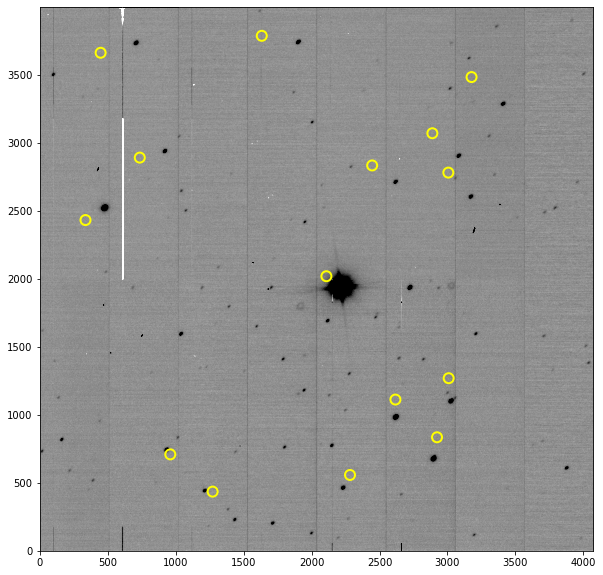

In [51]:
%matplotlib inline
from astropy.io import fits
from astropy.visualization import ZScaleInterval
import matplotlib.pyplot as plt
import numpy as np 
zscale = ZScaleInterval()

fig,ax = plt.subplots(1,1,figsize=(10,10))
data = postIsr.image.array
vmin,vmax = zscale.get_limits(data)
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')
ax.scatter(donutCatalogMagCut['centroid_x'], donutCatalogMagCut['centroid_y'], s=100, label='template fitting',
           facecolors='none', edgecolors='yellow', lw=2)

Instead of centroid, plot the `coord_ra` , `coord_dec` --> `x,y` : 

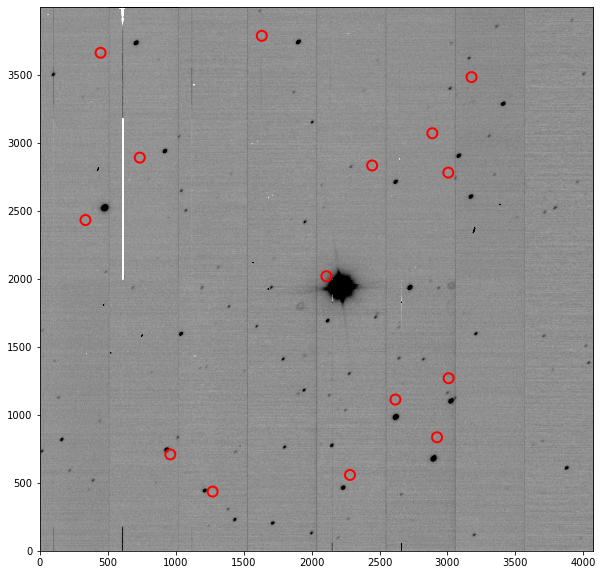

In [52]:
ra = donutCatalogMagCut['coord_ra']
dec = donutCatalogMagCut['coord_dec']
x,y = postIsr.wcs.skyToPixelArray(ra,dec)

fig,ax = plt.subplots(1,1,figsize=(10,10))
data = postIsr.image.array
vmin,vmax = zscale.get_limits(data)
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')
ax.scatter(x,y,s=100,facecolors='none', edgecolors='red',lw=2)

Rotate the WCS by 180 deg:

In [41]:
import lsst.geom
from lsst.afw.geom import makeSkyWcs,  makeCdMatrix


wcs = postIsr.getWcs()
rotationInDeg = 180 

info = postIsr.getInfo().getVisitInfo()
orientation = (info.getBoresightRotAngle().asDegrees()+\
               rotationInDeg)* lsst.geom.degrees#  info.getBoresightRotAngle()# 0 * lsst.geom.degrees  # 
flipX = True
scale =  wcs.getPixelScale() # 0.2 * lsst.geom.arcseconds  # how many arcsec per pixel 
cdMatrix = makeCdMatrix(scale=scale, orientation=orientation, flipX=flipX)

pxOrigin = wcs.getPixelOrigin()

crpix = pxOrigin
crval = wcs.getSkyOrigin() # lsst.geom.SpherePoint(0.0*lsst.geom.degrees, 0.0*lsst.geom.degrees)
newWcs = makeSkyWcs(crpix=crpix, crval=crval, cdMatrix=cdMatrix)

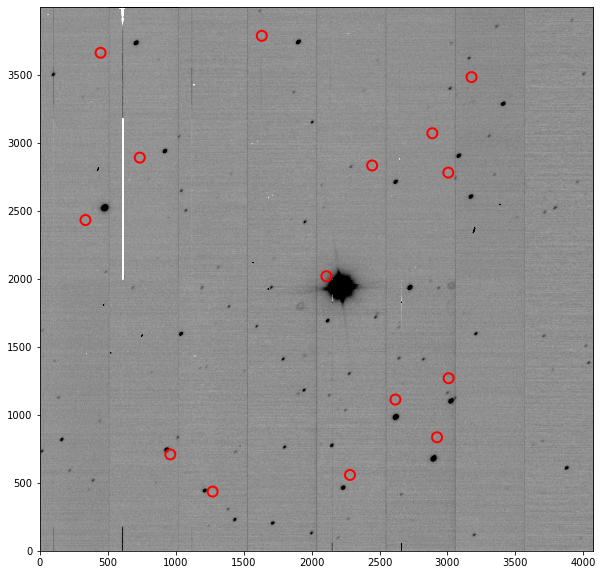

In [53]:
ra = donutCatalogMagCut['coord_ra']
dec = donutCatalogMagCut['coord_dec']
x,y = newWcs.skyToPixelArray(ra,dec)

fig,ax = plt.subplots(1,1,figsize=(10,10))
data = postIsr.image.array
vmin,vmax = zscale.get_limits(data)
ax.imshow(data, vmin=vmin, vmax=vmax,cmap='Greys', origin='lower')
ax.scatter(x,y,s=100,facecolors='none', edgecolors='red' ,lw=2)

Ok, that can be corrected with astrometry task... Next:

* get the code to do source detection and then run astrometry fitting against refCat in one continuous flow, so that at the end we have  a postIsr in-focus exposure with correct WCS
* pass that WCS to out-of-focus exposures
* run the Zernike estimation with the donut catalog from the new version of `GenerateDonutCatalogWcsTask` 